In [4]:
from astropy.io import fits
from astropy.wcs import WCS

def get_ps1_params_from_radio_fits(fits_path):
    hdul = fits.open(fits_path)
    header = hdul[0].header
    wcs = WCS(header)

    # Image size in pixels
    npix_x = header['NAXIS1']
    npix_y = header['NAXIS2']

    # Center pixel → sky coordinates
    x_center = npix_x / 2
    y_center = npix_y / 2
    center_coord = wcs.pixel_to_world(x_center, y_center)

    # Pixel scale: deg/pixel or CD matrix fallback
    try:
        scale_x = abs(header['CDELT1']) * 3600  # arcsec/pixel
        scale_y = abs(header['CDELT2']) * 3600
    except KeyError:
        cd = wcs.pixel_scale_matrix
        scale_x = abs(cd[0, 0]) * 3600
        scale_y = abs(cd[1, 1]) * 3600

    # FOV (arcsec)
    fov_x = npix_x * scale_x
    fov_y = npix_y * scale_y

    # Choose square field size (min of x and y)
    field_size_arcsec = int(min(fov_x, fov_y))

    hdul.close()

    return center_coord.ra.deg, center_coord.dec.deg, field_size_arcsec


In [2]:
#testing over downloaded file
ra, dec, size = get_ps1_params_from_radio_fits("../data/radio images/lotss1_0.03100_23.395000_r.fits")
print(f"Center: RA={ra:.5f}, Dec={dec:.5f}, Size={size}" )


Center: RA=0.03080, Dec=23.39572, Size=13406


In [9]:
from astropy.io import fits
from astropy.wcs import WCS

ps1_data, ps1_header = fits.getdata("../data/optical images/ps1_0.0308_23.3957_i.fits", header=True)
ps1_wcs = WCS(ps1_header)

this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


In [12]:
from astropy.io import fits

ps1_path = "../data/optical images/ps1_0.0308_23.3957_i.fits"
with fits.open(ps1_path) as hdul:
    hdul.info()
    print("Data is:", hdul[1].data)
    print("Shape is:", hdul[1].data.shape if hdul[1].data is not None else "No data")


Filename: ../data/optical images/ps1_0.0308_23.3957_i.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       6   ()      
  1  COMPRESSED_IMAGE    1 CompImageHDU    213   (6279, 6261)   int16 (rescales to float32)   
Data is: [[        nan         nan         nan ...         nan         nan
          nan]
 [        nan -2.2714944  -0.64342403 ... -0.06061983 -1.242022
          nan]
 [        nan -1.673564   -1.0353713  ...  0.49081993  0.20631361
          nan]
 ...
 [        nan  1.1339066   1.1456962  ... -1.0500526  -1.7758884
          nan]
 [        nan -1.1866331   0.26926517 ...  0.9359312  -0.32911015
          nan]
 [        nan         nan         nan ...         nan         nan
          nan]]
Shape is: (6261, 6279)


In [18]:
from astropy.io import fits
from astropy.wcs import WCS
from astropy.nddata import Cutout2D
from astropy.coordinates import SkyCoord
import astropy.units as u

# Load LOFAR image
lofar_path = "../data/radio images/lotss1_0.03100_23.395000_r.fits"
hdul = fits.open(lofar_path)
lofar_data = hdul[0].data
lofar_wcs = WCS(hdul[0].header)

# Use PS1 image to define target shape and WCS
ps1_path = "../data/optical images/ps1_0.0308_23.3957_i.fits"
ps1_hdul = fits.open(ps1_path)
ps1_shape = ps1_hdul[1].data.shape
ps1_wcs = WCS(ps1_hdul[1].header)
ps1_hdul.close()

# Define target center (same as PS1)
target_center = SkyCoord(ra=0.0308, dec=23.39572, unit='deg')

# Perform WCS-aware cutout
cutout = Cutout2D(lofar_data, position=target_center, size=ps1_shape,
                  wcs=lofar_wcs, mode='partial', fill_value=0)

# Result
sub_data = cutout.data
sub_wcs = cutout.wcs


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


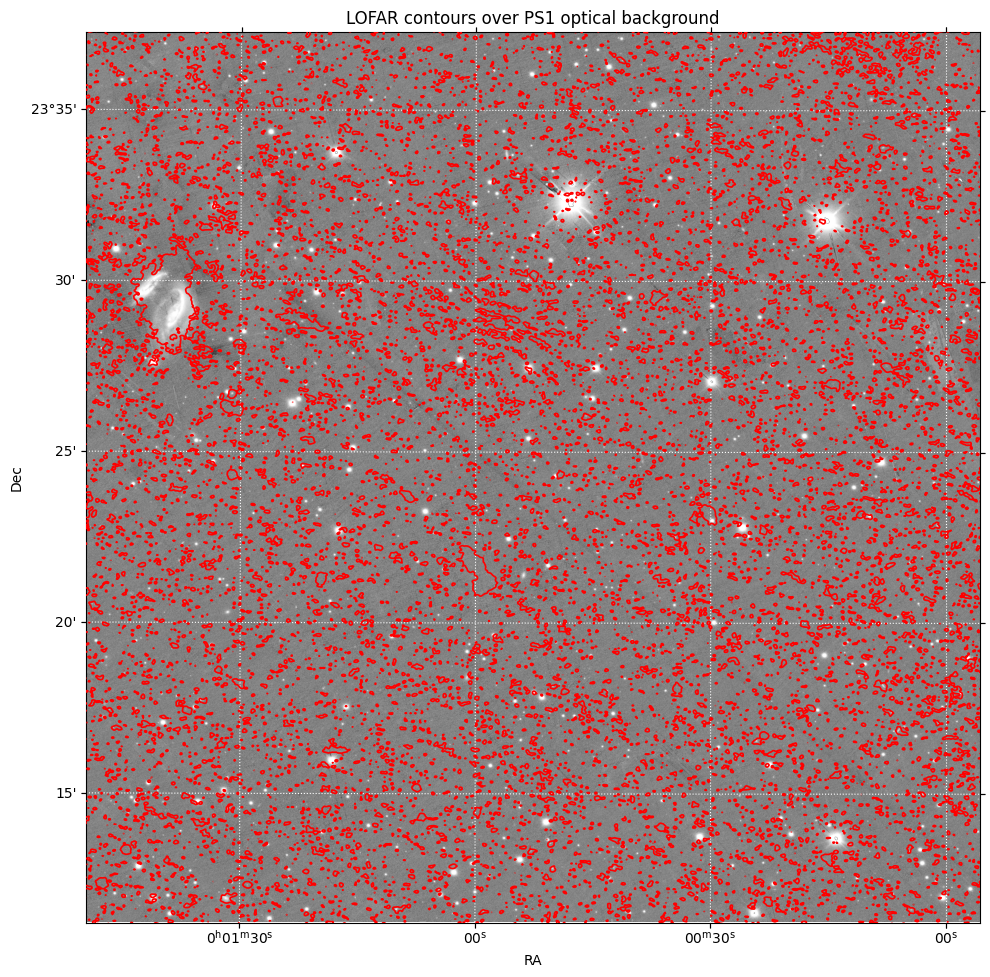

In [14]:
import matplotlib.pyplot as plt
from astropy.visualization import simple_norm
import numpy as np

fig = plt.figure(figsize=(10, 10))
ax = plt.subplot(projection=ps1_wcs)

norm = simple_norm(ps1_data, 'sqrt', percent=99.5)
ax.imshow(ps1_data, origin='lower', cmap='gray', norm=norm)

contour_levels = np.linspace(np.nanpercentile(sub_data, 90), np.nanmax(sub_data), 5)
ax.contour(sub_data, levels=contour_levels, transform=ax.get_transform(sub_wcs),
           colors='red', linewidths=1.2)

ax.set_xlabel('RA')
ax.set_ylabel('Dec')
ax.set_title('LOFAR contours over PS1 optical background')

plt.grid(color='white', ls='dotted')
plt.tight_layout()
plt.show()


Gaussian fittiing 

In [15]:
#save current cutout to a new fits file
from astropy.io import fits

hdu = fits.PrimaryHDU(data=sub_data, header=sub_wcs.to_header())
hdu.writeto("../data/processed files/lofar_cutout_matched.fits", overwrite=True)


In [21]:
#adding beam info and frequency to the cutout header
from astropy.io import fits
from astropy.wcs import WCS

# Open the original full LOFAR image to extract beam info
original_hdul = fits.open("../data/radio images/lotss1_0.03100_23.395000_r.fits")
original_header = original_hdul[0].header

bmaj = original_header.get('BMAJ')
bmin = original_header.get('BMIN')
bpa = original_header.get('BPA')

print(f"BMAJ: {bmaj}, BMIN: {bmin}, BPA: {bpa}")

# Now add these to the cutout header
hdu = fits.PrimaryHDU(data=sub_data, header=sub_wcs.to_header())
hdu.header['BMAJ'] = bmaj
hdu.header['BMIN'] = bmin
hdu.header['BPA'] = bpa
hdu.header['RESTFRQ'] = 1.44e8  # Hz (Typical central observing frequency for LOFAR)

# This is needed because PyBDSF tries to access the frequency axis from WCS
hdu.header['NAXIS'] = 3
hdu.header['NAXIS3'] = 1
hdu.header['CTYPE3'] = 'FREQ'
hdu.header['CRVAL3'] = 1.44e8  # reference frequency in Hz
hdu.header['CRPIX3'] = 1       # reference pixel
hdu.header['CDELT3'] = 1.0     # arbitrary, doesn't matter for 1 channel
hdu.header['RESTFRQ'] = 1.44e8

hdu.writeto("../data/processed files/lofar_cutout_matched.fits", overwrite=True)


BMAJ: 0.001666666666666667, BMIN: 0.001666666666666667, BPA: 90


In [1]:
# Run PyBDSF with immediate file output (no Python objects)
import bdsf

img = bdsf.process_image(
    '../data/processed files/lofar_cutout_matched.fits',
    rms_box=(150, 30),
    atrous_do=True,
    advanced_opts=True, 
    group_by_isl=True,
    # Force immediate file output before crash
    output_opts=True,
    output_all=True,
    opdir_overwrite='overwrite'
)

--> Opened '../data/processed files/lofar_cutout_matched.fits'
Image size .............................. : (6279, 6261) pixels
Number of channels ...................... : 1
Number of Stokes parameters ............. : 1
Beam shape (major, minor, pos angle) .... : (1.66667e-03, 1.66667e-03, 90) degrees
Frequency of image ...................... : 144.000 MHz
Number of blank pixels .................. : 0 (0.0%)
Flux from sum of (non-blank) pixels ..... : 35.084 Jy
--> Calculating background rms and mean images
Using user-specified rms_box ............ : (150, 30) pixels
--> Variation in rms image significant
--> Using 2D map for background rms
--> Variation in mean image significant
--> Using 2D map for background mean
Min/max values of background rms map .... : (7.47e-05, 8.34e-04) Jy/beam
Min/max values of background mean map ... : (-6.94e-05, 2.63e-05) Jy/beam
--> Expected 5-sigma-clipped false detection rate < fdr_ratio
--> Using sigma-clipping ('hard') thresholding
Minimum number of p

Fitting islands with Gaussians .......... : [|] 0/3433//Fitting islands with Gaussians .......... : [/] 1/3433/Fitting islands with Gaussians .......... : [/] 1/3433--Fitting islands with Gaussians .......... : [/] 1/3433Fitting islands with Gaussians .......... : [-] 2/3433Fitting islands with Gaussians .......... : [-] 2/3433\\Fitting islands with Gaussians .......... : [\] 3/3433Fitting islands with Gaussians .......... : [\] 3/3433////Fitting islands with Gaussians .......... : [/] 5/3433Fitting islands with Gaussians .......... : [/] 5/3433Fitting islands with Gaussians .......... : [/] 5/3433Fitting islands with Gaussians .......... : [/] 5/3433\\|////Fitting islands with Gaussians .......... : [\] 6/3433Fitting islands with Gaussians .......... : [/] 9/3433Fitting islands with Gaussians .......... : [|] 8/3433\Fitting islands with Gaussians .......... : [-] 10/3433\Fitting islands with Gaussians .......... : [/] 9/3433Fitting islands with Gaussians .......... : [/] 9/3433|-Fitti

/home/aswin/miniconda3/envs/casa/lib/python3.13/site-packages/bdsf/gausfit.py:806: RuntimeWarning: overflow encountered in cast
  if A < opts.flag_minsnr*thr:


Fitting islands with Gaussians .......... : [/] 87/3433//Fitting islands with Gaussians .......... : [\] 85/3433\|Fitting islands with Gaussians .......... : [/] 87/3433Fitting islands with Gaussians .......... : [/] 87/3433|Fitting islands with Gaussians .......... : [\] 89/3433|-\Fitting islands with Gaussians .......... : [|] 90/3433Fitting islands with Gaussians .......... : [|] 90/3433|Fitting islands with Gaussians .......... : [|] 91/3433Fitting islands with Gaussians .......... : [-] 93/3433/Fitting islands with Gaussians .......... : [\] 93/3433-Fitting islands with Gaussians .......... : [|] 95/3433\\Fitting islands with Gaussians .......... : [/] 95/3433Fitting islands with Gaussians .......... : [\] 97/3433/Fitting islands with Gaussians .......... : [\] 97/3433Fitting islands with Gaussians .......... : [-] 96/3433\Fitting islands with Gaussians .......... : [/] 99/3433///Fitting islands with Gaussians .......... : [\] 101/3433//Fitting islands with Gaussians .......... : 

Total number of Gaussians fit to image .. : 4334
Total flux density in model ............. : 37.801 Jy

--> Wavelet scale #1
--> Calculating background rms and mean images
Using user-specified rms_box ............ : (150, 50) pixels
--> Variation in rms image significant
--> Using 2D map for background rms
--> Variation in mean image not significant
--> Using constant background mean
Min/max values of background rms map .... : (5.20e-05, 6.55e-04) Jy/beam
Value of background mean ................ : -0.0 Jy/beam
Number of islands found ................. : 840


Fitting islands with Gaussians .......... : [|] 0/840/Fitting islands with Gaussians .......... : [/] 1/840/--Fitting islands with Gaussians .......... : [/] 1/840Fitting islands with Gaussians .......... : [-] 2/840Fitting islands with Gaussians .......... : [-] 2/840|||Fitting islands with Gaussians .......... : [|] 4/840Fitting islands with Gaussians .......... : [|] 4/840Fitting islands with Gaussians .......... : [|] 4/840//Fitting islands with Gaussians .......... : [/] 5/840Fitting islands with Gaussians .......... : [/] 5/840||||Fitting islands with Gaussians .......... : [|] 8/840Fitting islands with Gaussians .......... : [|] 8/840Fitting islands with Gaussians .......... : [|] 8/840Fitting islands with Gaussians .......... : [|] 8/840-\\\\\\Fitting islands with Gaussians .......... : [\] 12/840Fitting islands with Gaussians .......... : [-] 12/840Fitting islands with Gaussians .......... : [\] 12/840Fitting islands with Gaussians .......... : [\] 12/840Fitting islands with G

/home/aswin/miniconda3/envs/casa/lib/python3.13/site-packages/bdsf/gausfit.py:806: RuntimeWarning: overflow encountered in cast
  if A < opts.flag_minsnr*thr:


|||Fitting islands with Gaussians .......... : [-] 15/840Fitting islands with Gaussians .......... : [\] 17/840Fitting islands with Gaussians .......... : [|] 17/840Fitting islands with Gaussians .......... : [|] 17/840Fitting islands with Gaussians .......... : [|] 17/840Fitting islands with Gaussians .......... : [|] 17/840Fitting islands with Gaussians .......... : [|] 17/840|Fitting islands with Gaussians .......... : [|] 17/840-Fitting islands with Gaussians .......... : [|] 17/840Fitting islands with Gaussians .......... : [-] 19/840---\Fitting islands with Gaussians .......... : [-] 25/840\\Fitting islands with Gaussians .......... : [-] 26/840Fitting islands with Gaussians .......... : [-] 25/840\Fitting islands with Gaussians .......... : [\] 26/840Fitting islands with Gaussians .......... : [\] 26/840\||Fitting islands with Gaussians .......... : [\] 26/840Fitting islands with Gaussians .......... : [\] 26/840Fitting islands with Gaussians .......... : [|] 27/840\Fitting isla

Total number of Gaussians fit to image .. : 630


Checking islands for overlap ............ : [|] 0/840/Checking islands for overlap ............ : [/] 1/840-Checking islands for overlap ............ : [-] 2/840\Checking islands for overlap ............ : [\] 3/840|Checking islands for overlap ............ : [|] 4/840/Checking islands for overlap ............ : [/] 5/840-Checking islands for overlap ............ : [-] 6/840\Checking islands for overlap ............ : [\] 7/840|Checking islands for overlap ............ : [|] 8/840/Checking islands for overlap ............ : [/] 9/840-Checking islands for overlap ............ : [-] 10/840\Checking islands for overlap ............ : [\] 11/840|Checking islands for overlap ............ : [|] 12/840/Checking islands for overlap ............ : [/] 13/840-Checking islands for overlap ............ : [-] 14/840\Checking islands for overlap ............ : [\] 15/840|Checking islands for overlap ............ : [|] 16/840/Checking islands for overlap ............ : [/] 17/840-Checking islands for

--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 590

--> Wavelet scale #2
--> Calculating background rms and mean images
Using user-specified rms_box ............ : (150, 50) pixels
--> Variation in rms image significant
--> Using 2D map for background rms
--> Variation in mean image not significant
--> Using constant background mean
Min/max values of background rms map .... : (2.99e-05, 4.47e-04) Jy/beam
Value of background mean ................ : -0.0 Jy/beam
Number of islands found ................. : 332


Fitting islands with Gaussians .......... : [|] 0/332//Fitting islands with Gaussians .......... : [/] 1/332Fitting islands with Gaussians .......... : [/] 1/332/Fitting islands with Gaussians .......... : [/] 1/332\\\Fitting islands with Gaussians .......... : [\] 3/332||Fitting islands with Gaussians .......... : [\] 3/332Fitting islands with Gaussians .......... : [\] 3/332Fitting islands with Gaussians .......... : [|] 4/332Fitting islands with Gaussians .......... : [|] 4/332\\\\Fitting islands with Gaussians .......... : [\] 7/332Fitting islands with Gaussians .......... : [\] 7/332Fitting islands with Gaussians .......... : [\] 7/332Fitting islands with Gaussians .......... : [\] 7/332///Fitting islands with Gaussians .......... : [/] 9/332Fitting islands with Gaussians .......... : [/] 9/332Fitting islands with Gaussians .......... : [/] 9/332\\\\\Fitting islands with Gaussians .......... : [\] 12/332Fitting islands with Gaussians .......... : [\] 12/332Fitting islands with Gau

Total number of Gaussians fit to image .. : 250


Checking islands for overlap ............ : [|] 0/332/Checking islands for overlap ............ : [/] 1/332-Checking islands for overlap ............ : [-] 2/332\Checking islands for overlap ............ : [\] 3/332|Checking islands for overlap ............ : [|] 4/332/Checking islands for overlap ............ : [/] 5/332-Checking islands for overlap ............ : [-] 6/332\Checking islands for overlap ............ : [\] 7/332|Checking islands for overlap ............ : [|] 8/332/Checking islands for overlap ............ : [/] 9/332-Checking islands for overlap ............ : [-] 10/332\Checking islands for overlap ............ : [\] 11/332|Checking islands for overlap ............ : [|] 12/332/Checking islands for overlap ............ : [/] 13/332-Checking islands for overlap ............ : [-] 14/332\Checking islands for overlap ............ : [\] 15/332|Checking islands for overlap ............ : [|] 16/332/Checking islands for overlap ............ : [/] 17/332-Checking islands for

--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 236

--> Wavelet scale #3
--> Calculating background rms and mean images
Using user-specified rms_box ............ : (150, 50) pixels
--> Variation in rms image significant
--> Using 2D map for background rms
--> Variation in mean image not significant
--> Using constant background mean
Min/max values of background rms map .... : (1.56e-05, 2.45e-04) Jy/beam
Value of background mean ................ : -0.0 Jy/beam
Number of islands found ................. : 86


Fitting islands with Gaussians .......... : [|] 0/86/Fitting islands with Gaussians .......... : [/] 1/86/Fitting islands with Gaussians .......... : [/] 1/86/--Fitting islands with Gaussians .......... : [-] 2/86Fitting islands with Gaussians .......... : [/] 1/86Fitting islands with Gaussians .......... : [-] 2/86|||Fitting islands with Gaussians .......... : [|] 4/86Fitting islands with Gaussians .......... : [|] 4/86Fitting islands with Gaussians .......... : [|] 4/86/||||Fitting islands with Gaussians .......... : [/] 5/86Fitting islands with Gaussians .......... : [|] 8/86Fitting islands with Gaussians .......... : [|] 8/86Fitting islands with Gaussians .......... : [|] 8/86|Fitting islands with Gaussians .......... : [|] 8/86/Fitting islands with Gaussians .......... : [|] 8/86Fitting islands with Gaussians .......... : [/] 9/86\\Fitting islands with Gaussians .......... : [\] 15/86Fitting islands with Gaussians .......... : [\] 15/86|Fitting islands with Gaussians .......... : 

Total number of Gaussians fit to image .. : 69



Checking islands for overlap ............ : [|] 0/86/Checking islands for overlap ............ : [/] 1/86-Checking islands for overlap ............ : [-] 2/86\Checking islands for overlap ............ : [\] 3/86|Checking islands for overlap ............ : [|] 4/86/Checking islands for overlap ............ : [/] 5/86-Checking islands for overlap ............ : [-] 6/86\Checking islands for overlap ............ : [\] 7/86|Checking islands for overlap ............ : [|] 8/86/Checking islands for overlap ............ : [/] 9/86-Checking islands for overlap ............ : [-] 10/86\Checking islands for overlap ............ : [\] 11/86|Checking islands for overlap ............ : [|] 12/86/Checking islands for overlap ............ : [/] 13/86-Checking islands for overlap ............ : [-] 14/86\Checking islands for overlap ............ : [\] 15/86|Checking islands for overlap ............ : [|] 16/86/Checking islands for overlap ............ : [/] 17/86-Checking islands for overlap ........

--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 67

--> Wavelet scale #4
--> Calculating background rms and mean images
Using user-specified rms_box ............ : (165, 55) pixels
--> Variation in rms image significant
--> Using 2D map for background rms
--> Variation in mean image not significant
--> Using constant background mean
Min/max values of background rms map .... : (7.40e-06, 1.81e-04) Jy/beam
Value of background mean ................ : -0.0 Jy/beam
Number of islands found ................. : 24


Fitting islands with Gaussians .......... : [|] 0/24/Fitting islands with Gaussians .......... : [/] 1/24--Fitting islands with Gaussians .......... : [-] 2/24Fitting islands with Gaussians .......... : [-] 2/24|Fitting islands with Gaussians .......... : [|] 4/24/Fitting islands with Gaussians .......... : [/] 5/24-Fitting islands with Gaussians .......... : [-] 6/24\\Fitting islands with Gaussians .......... : [\] 7/24Fitting islands with Gaussians .......... : [\] 7/24/Fitting islands with Gaussians .......... : [/] 9/24/Fitting islands with Gaussians .......... : [/] 9/24\Fitting islands with Gaussians .......... : [\] 11/24|Fitting islands with Gaussians .......... : [|] 12/24||Fitting islands with Gaussians .......... : [|] 12/24Fitting islands with Gaussians .......... : [|] 12/24\Fitting islands with Gaussians .......... : [\] 15/24|Fitting islands with Gaussians .......... : [|] 16/24/Fitting islands with Gaussians .......... : [/] 17/24-Fitting islands with Gaussians ........

Total number of Gaussians fit to image .. : 24



Checking islands for overlap ............ : [|] 0/24/Checking islands for overlap ............ : [/] 1/24-Checking islands for overlap ............ : [-] 2/24\Checking islands for overlap ............ : [\] 3/24|Checking islands for overlap ............ : [|] 4/24/Checking islands for overlap ............ : [/] 5/24-Checking islands for overlap ............ : [-] 6/24\Checking islands for overlap ............ : [\] 7/24|Checking islands for overlap ............ : [|] 8/24/Checking islands for overlap ............ : [/] 9/24-Checking islands for overlap ............ : [-] 10/24\Checking islands for overlap ............ : [\] 11/24|Checking islands for overlap ............ : [|] 12/24/Checking islands for overlap ............ : [/] 13/24-Checking islands for overlap ............ : [-] 14/24\Checking islands for overlap ............ : [\] 15/24|Checking islands for overlap ............ : [|] 16/24/Checking islands for overlap ............ : [/] 17/24-Checking islands for overlap ........

--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 21

--> Wavelet scale #5
--> Calculating background rms and mean images
Using user-specified rms_box ............ : (325, 108) pixels
--> Variation in rms image not significant
--> Using constant background rms
--> Variation in mean image not significant
--> Using constant background mean
Value of background rms ................. : 7.11e-06 Jy/beam
Value of background mean ................ : -0.0 Jy/beam
Number of islands found ................. : 18


Fitting islands with Gaussians .......... : [|] 0/18//Fitting islands with Gaussians .......... : [/] 1/18Fitting islands with Gaussians .......... : [/] 1/18\Fitting islands with Gaussians .......... : [\] 3/18|||Fitting islands with Gaussians .......... : [|] 4/18Fitting islands with Gaussians .......... : [|] 4/18Fitting islands with Gaussians .......... : [|] 4/18\Fitting islands with Gaussians .......... : [\] 6/18|Fitting islands with Gaussians .......... : [|] 7/18/Fitting islands with Gaussians .......... : [/] 8/18-Fitting islands with Gaussians .......... : [-] 9/18\Fitting islands with Gaussians .......... : [\] 10/18|Fitting islands with Gaussians .......... : [|] 11/18/Fitting islands with Gaussians .......... : [/] 12/18-Fitting islands with Gaussians .......... : [-] 13/18\Fitting islands with Gaussians .......... : [\] 14/18|Fitting islands with Gaussians .......... : [|] 15/18/Fitting islands with Gaussians .......... : [/] 16/18-Fitting islands with Gaussians ........

Total number of Gaussians fit to image .. : 18



Checking islands for overlap ............ : [|] 0/18/Checking islands for overlap ............ : [/] 1/18-Checking islands for overlap ............ : [-] 2/18\Checking islands for overlap ............ : [\] 3/18|Checking islands for overlap ............ : [|] 4/18/Checking islands for overlap ............ : [/] 5/18-Checking islands for overlap ............ : [-] 6/18\Checking islands for overlap ............ : [\] 7/18|Checking islands for overlap ............ : [|] 8/18/Checking islands for overlap ............ : [/] 9/18-Checking islands for overlap ............ : [-] 10/18\Checking islands for overlap ............ : [\] 11/18|Checking islands for overlap ............ : [|] 12/18/Checking islands for overlap ............ : [/] 13/18-Checking islands for overlap ............ : [-] 14/18\Checking islands for overlap ............ : [\] 15/18|Checking islands for overlap ............ : [|] 16/18/Checking islands for overlap ............ : [/] 17/18[-2GChecking islands for overlap ....

--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 17

--> Wavelet scale #6
--> Calculating background rms and mean images
Using user-specified rms_box ............ : (645, 215) pixels
--> Variation in rms image not significant
--> Using constant background rms
--> Variation in mean image not significant
--> Using constant background mean
Value of background rms ................. : 4.09e-06 Jy/beam
Value of background mean ................ : -0.0 Jy/beam
Number of islands found ................. : 0


Checking islands for overlap ............ : [] 0/0
Checking islands for overlap ............ : [] 0/0



--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0

--> Wavelet scale #7
--> Calculating background rms and mean images
Using user-specified rms_box ............ : (1285, 428) pixels
--> Variation in rms image not significant
--> Using constant background rms
--> Variation in mean image not significant
--> Using constant background mean
Value of background rms ................. : 3.13e-06 Jy/beam
Value of background mean ................ : -0.0 Jy/beam
Number of islands found ................. : 0


Checking islands for overlap ............ : [] 0/0
Checking islands for overlap ............ : [] 0/0



--> Grouping Gaussians into sources
Number of sources formed from Gaussians   : 0
Total flux density in model on all scales : 41.133 Jy
--> Grouping Gaussians into sources
/home/aswin/miniconda3/envs/casa/lib/python3.13/site-packages/bdsf/functions.py:624: RuntimeWarning: Number of calls to function has reached maxfev = 1400.
  p, success = leastsq(errorfunction, p_ini)
Number of sources formed from Gaussians   : 3997
    Island #2 (x=0, y=5067): fit with 1 Gaussian with flag = 4
    Island #35 (x=78, y=3043): fit with 1 Gaussian with flag = 268
    Island #186 (x=318, y=3196): fit with 1 Gaussian with flag = 256
    Island #214 (x=352, y=3508): fit with 1 Gaussian with flag = 256
    Island #224 (x=361, y=4732): fit with 1 Gaussian with flag = 256
    Island #313 (x=536, y=5475): fit with 1 Gaussian with flag = 256
    Island #550 (x=969, y=4072): fit with 1 Gaussian with flag = 256
    Island #603 (x=1047, y=2600): fit with 1 Gaussian with flag = 256
    Island #609 (x=1058, y=6200):

In [4]:
from astropy.table import Table

catalog_path = "../data/processed files/lofar_cutout_matched_pybdsf/catalogues/lofar_cutout_matched.pybdsf.srl.FITS"
srl_table = Table.read(catalog_path)

# Preview the first few sources
srl_table[:5]


Source_id,Isl_id,RA,E_RA,DEC,E_DEC,Total_flux,E_Total_flux,Peak_flux,E_Peak_flux,RA_max,E_RA_max,DEC_max,E_DEC_max,Maj,E_Maj,Min,E_Min,PA,E_PA,Maj_img_plane,E_Maj_img_plane,Min_img_plane,E_Min_img_plane,PA_img_plane,E_PA_img_plane,DC_Maj,E_DC_Maj,DC_Min,E_DC_Min,DC_PA,E_DC_PA,DC_Maj_img_plane,E_DC_Maj_img_plane,DC_Min_img_plane,E_DC_Min_img_plane,DC_PA_img_plane,E_DC_PA_img_plane,Isl_Total_flux,E_Isl_Total_flux,Isl_rms,Isl_mean,Resid_Isl_rms,Resid_Isl_mean,S_Code
,,deg,deg,deg,deg,Jy,Jy,Jy / beam,Jy / beam,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,deg,Jy,Jy,Jy / beam,Jy / beam,Jy / beam,Jy / beam,
int32,int32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,bytes1
0,0,1.4443193219354973,0.00016233662166258657,22.31857926542792,0.000198005294297099,0.0013185442609361523,0.0002967225569107478,0.0005739214397255074,9.426099859410897e-05,1.4443193219354973,0.00016233662166258657,22.31857926542792,0.000198005294297099,0.0028015652602086214,0.0004898955154314313,0.002278913820993254,0.0003515548003079527,26.62428320006363,30.097164154052734,0.0028005582044933214,0.0004898955154314313,0.0022787420163852407,0.0003515548003079527,26.087607424940074,30.097164154052734,0.0022514422137215836,0.0004898955154314313,0.0015541079600329096,0.0003515548003079527,26.6242832000625,30.097164154052734,0.0022506329063126185,0.0004898955154314313,0.0015539907977403164,0.0003515548003079527,26.087607424938945,30.097164154052734,0.0010837589021399476,0.00011613635760117904,8.741527562960982e-05,5.527239181901678e-07,0.00013844150546133037,6.11178435904585e-05,S
1,1,1.4582605544576743,2.8419548091223313e-05,23.69558429270487,1.2316103958028265e-05,0.013563749060475505,0.0005955517315799802,0.0052997842701232555,8.713193528819829e-05,1.460182847755493,2.8419548091223313e-05,23.69534004930079,1.2316103958028265e-05,0.002956955755159182,6.719828623760355e-05,0.001778980944056658,2.8358347051674096e-05,174.84840278411494,1.2176636306872055,0.0029568702746060015,6.719828623760355e-05,0.0017785442192946716,2.8358347051674096e-05,174.2749571851211,1.2176636306872055,0.002442467799412875,6.719828623760355e-05,0.0006209920106235748,2.8358347051674096e-05,174.84840278411508,1.2176636306872055,0.0024423971919143132,6.719828623760355e-05,0.0006208395623738729,2.8358347051674096e-05,174.27495718512125,1.2176636306872055,0.009493840212126318,0.0002046365638036548,8.713193528819829e-05,1.7432275853934698e-06,6.7830623270838e-05,5.115334851797565e-06,M
2,3,1.4476166329070412,0.0003953934489867522,22.988073289507575,0.00016971727327932221,0.0009193375189811645,0.00029224911666235644,0.0003788824919120719,8.811861334834248e-05,1.4476166329070412,0.0003953934489867522,22.988073289507575,0.00016971727327932221,0.0034175676731785748,0.0009349377929889363,0.001972758498815934,0.0003900520976579883,84.66927110652055,13.872998237609863,0.003416635692317149,0.0009349377929889363,0.001972737376827297,0.0003900520976579883,84.11615259122121,13.872998237609863,0.002983366451824543,0.0009349377929889363,0.0010554330075626353,0.0003900520976579883,84.66927110652045,13.872998237609863,0.0029825528790346206,0.0009349377929889363,0.0010554217072590755,0.0003900520976579883,84.11615259122111,13.872998237609863,0.0007119855332512502,0.0001251258295470466,8.531173807568848e-05,5.766951289842837e-07,4.254709042836911e-05,3.771269063972063e-05,S
3,4,1.4626989337567846,0.00015655300830114835,24.336392324476662,8.803900727263828e-05,0.0006996347534010084,0.00016370504321453695,0.0005743166988809318,8.089606853900477e-05,1.4626989337567846,0.00015655300830114835,24.336392324476662,8.803900727263828e-05,0.0022667243162550095,0.00038514183068344237,

In [4]:
from astropy.table import Table

# Load the PyBDSF source catalog
catalog_path = '../data/processed files/lofar_cutout_matched_pybdsf/catalogues/lofar_cutout_matched.pybdsf.srl.FITS'
catalog = Table.read(catalog_path)

# Filter only 'S' or 'M' codes (reliable fits)
good_sources = catalog[(catalog['S_Code'] == b'S') | (catalog['S_Code'] == b'M')]
print(f"Found {len(good_sources)} good sources (S or M)")

Found 3997 good sources (S or M)


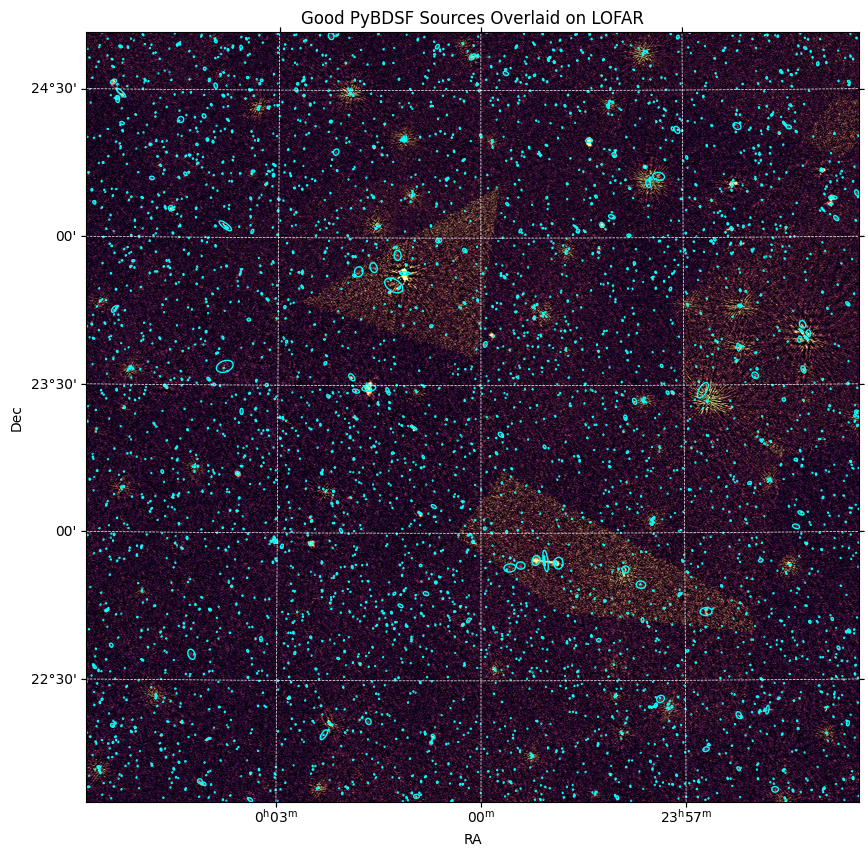

In [9]:
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from matplotlib.patches import Ellipse
import numpy as np
from astropy.coordinates import SkyCoord

# Load radio image and WCS
fits_path = '../data/processed files/lofar_cutout_matched.fits'
hdu = fits.open(fits_path)[0]
data = hdu.data.squeeze()
wcs = WCS(hdu.header, naxis=2)

fig, ax = plt.subplots(subplot_kw={'projection': wcs}, figsize=(10, 10))
ax.imshow(data, origin='lower', cmap='inferno', vmin=0, vmax=np.percentile(data, 99))

# Plot ellipses for each Gaussian component
for source in good_sources:
    x, y = source['RA'], source['DEC']
    major = source['Maj'] * 3600  # deg → arcsec
    minor = source['Min'] * 3600
    angle = source['PA']

    skycoord = SkyCoord(ra=x, dec=y, unit='deg')
    px, py = skycoord.to_pixel(wcs)

    ellipse = Ellipse((px, py), width=major, height=minor, angle=-angle,
                      edgecolor='cyan', facecolor='none', lw=1)
    ax.add_patch(ellipse)

ax.set_xlabel("RA")
ax.set_ylabel("Dec")
plt.title("Good PyBDSF Sources Overlaid on LOFAR")
plt.grid(color='white', ls='--', lw=0.5)
plt.show()


In [12]:
from astroquery.vizier import Vizier
import astropy.units as u
from astropy.coordinates import SkyCoord

# Configure Vizier (remove limit max rows returned)
Vizier.ROW_LIMIT = -1
Vizier.TIMEOUT = 120   # Increase timeout to 2 minutes

# Define source coordinates
radio_coords = SkyCoord(ra=good_sources['RA'], dec=good_sources['DEC'], unit='deg')

# Query PS1 catalogue around each source
result = Vizier.query_region(radio_coords[:50], radius=1 * u.arcsec, catalog='II/349/ps1')

# Extract match results
if len(result) > 0:
    ps1_matches = result[0]
    print(f"Matched {len(ps1_matches)} sources with PS1")
else:
    print("No matches found.")


Matched 12 sources with PS1


In [13]:
print(len(radio_coords))

3997


In [21]:
#chunked running with better error handling
from astropy.table import Table

# Load the source catalog
catalog = Table.read('../data/processed files/lofar_cutout_matched_pybdsf/catalogues/lofar_cutout_matched.pybdsf.srl.FITS')
good_sources = catalog[catalog['S_Code'] == b'S']

# Extract coordinates
ra_values = good_sources['RA'].astype(float)     # in degrees
dec_values = good_sources['DEC'].astype(float)   # in degrees

from astroquery.vizier import Vizier
from astropy.coordinates import SkyCoord
import astropy.units as u
import time

# Full coordinates list
coords = SkyCoord(ra=ra_values, dec=dec_values)
print(f"Total sources to query: {len(coords)}")

# Vizier setup
Vizier.ROW_LIMIT = -1
Vizier.TIMEOUT = 120

# Output containers
matches = []
failed_indices = []

# Process each coordinate individually with better tracking
for idx, coord in enumerate(coords):
    if idx % 50 == 0:
        print(f"Processed {idx}/{len(coords)} sources...")
    
    try:
        res = Vizier.query_region(coord, radius=1 * u.arcsec, catalog="II/349/ps1")
        if res and len(res) > 0:
            # Add source index to match for later reference
            match_table = res[0]
            match_table['radio_source_idx'] = idx
            matches.append(match_table)
        
        # Small delay to avoid overwhelming the server
        if idx % 10 == 0:
            time.sleep(1)
            
    except Exception as e:
        print(f"Query failed for source {idx} (RA={coord.ra.deg:.5f}, Dec={coord.dec.deg:.5f}): {e}")
        failed_indices.append(idx)
        time.sleep(2)  # Longer wait after failures

print(f"\nCompleted! Found matches for {len(matches)} sources")
print(f"Failed queries: {len(failed_indices)}")

Total sources to query: 3486
Processed 0/3486 sources...
Processed 50/3486 sources...
Processed 50/3486 sources...
Processed 100/3486 sources...
Processed 100/3486 sources...
Processed 150/3486 sources...
Processed 150/3486 sources...
Query failed for source 191 (RA=1.28392, Dec=24.05403): ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
Query failed for source 191 (RA=1.28392, Dec=24.05403): ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
Processed 200/3486 sources...
Processed 200/3486 sources...
Processed 250/3486 sources...
Processed 250/3486 sources...
Processed 300/3486 sources...
Processed 300/3486 sources...
Query failed for source 323 (RA=1.13777, Dec=22.82918): ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
Query failed for source 323 (RA=1.13777, Dec=22.82918): ('Connection aborted.', RemoteDisconnected('Remote end closed connection without r

In [6]:
from astropy.table import Table

# Load the PyBDSF source catalog
catalog_path = '../data/processed files/lofar_cutout_matched_pybdsf/catalogues/lofar_cutout_matched.pybdsf.srl.FITS'
catalog = Table.read(catalog_path)

# Filter only 'S' or 'M' codes (reliable fits)
good_sources = catalog[(catalog['S_Code'] == b'S') | (catalog['S_Code'] == b'M')]
print(f"Found {len(good_sources)} good sources (S or M)")

Found 3997 good sources (S or M)


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


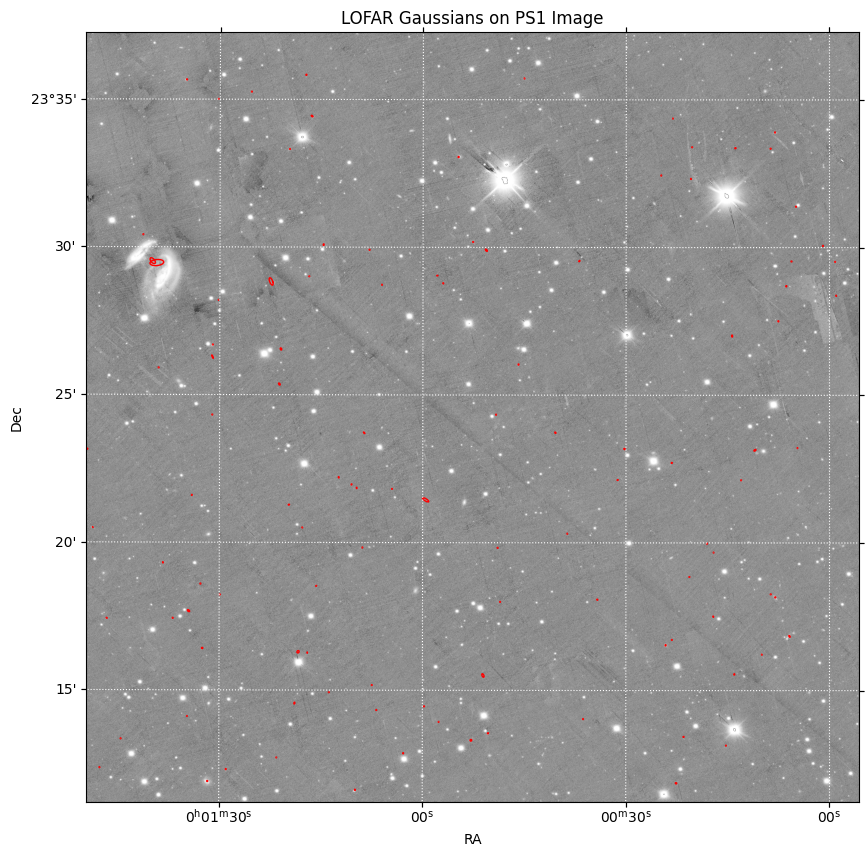

In [6]:
#overlay good gaussians on PS1 image
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.table import Table
from matplotlib.patches import Ellipse
import numpy as np
from astropy.visualization import PercentileInterval, AsinhStretch, ImageNormalize

# Load PS1 image and WCS
ps1_path = '../data/optical images/ps1_0.0308_23.3957_i.fits'
ps1_hdul = fits.open(ps1_path)
ps1_data = ps1_hdul[1].data
ps1_wcs = WCS(ps1_hdul[1].header)
ps1_hdul.close()

# Load good LOFAR sources (previously filtered)
#good_sources = Table.read('../data/processed files/lofar_cutout_matched_pybdsf/catalogues/lofar_cutout_matched.pybdsf.srl.FITS')

# Image normalization for better contrast
norm = ImageNormalize(data=ps1_data, interval=PercentileInterval(99.5), stretch=AsinhStretch())

# Start plot with WCS projection
fig, ax = plt.subplots(figsize=(10, 10), subplot_kw={'projection': ps1_wcs})
ax.imshow(ps1_data, cmap='gray', origin='lower', norm=norm)

# Add ellipses for good sources
for src in good_sources:
#    if src['S_Code'].strip() not in ('S','M'):  # Optional: skip poor-quality sources
#        continue

    ra, dec = src['RA'], src['DEC']
    major = src['Maj'] * 3600  # degrees to arcsec
    minor = src['Min'] * 3600
    pa = src['PA']

    x, y = ps1_wcs.world_to_pixel_values(ra, dec)
    e = Ellipse((x, y), width=major, height=minor, angle=-pa,
                edgecolor='red', facecolor='none', lw=1)
    ax.add_patch(e)

ax.set_title("LOFAR Gaussians on PS1 Image")
ax.set_xlabel('RA')
ax.set_ylabel('Dec')
plt.grid(color='white', ls='dotted')
plt.show()



Creating advanced radio-optical visualization with proper statistics...


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Radio data shape: (6261, 6279), range: [-8.29e-03, 2.15e+00]
Optical data shape: (6261, 6279), range: [-3.25e+00, 1.12e+01]

Radio Statistics:
  RMS: 1.72e-03 Jy/beam
  Median: -7.55e-07 Jy/beam
  Peak: 2.15e+00 Jy/beam
  5-sigma level: 8.61e-03 Jy/beam

Radio Statistics:
  RMS: 1.72e-03 Jy/beam
  Median: -7.55e-07 Jy/beam
  Peak: 2.15e+00 Jy/beam
  5-sigma level: 8.61e-03 Jy/beam

Optical Statistics:
  RMS: 5.66e-01 counts
  Median: 1.22e-03 counts
  Peak: 1.12e+01 counts
  3-sigma level: 1.70e+00 counts

Contour levels:
  Radio: 9 levels from 5.17e-03 to 1.32e+00
  Optical: 6 levels from 1.13e+00 to 8.60e+00

Creating Plot 1: Radio contours on optical background...

Optical Statistics:
  RMS: 5.66e-01 counts
  Median: 1.22e-03 counts
  Peak: 1.12e+01 counts
  3-sigma level: 1.70e+00 counts

Contour levels:
  Radio: 9 levels from 5.17e-03 to 1.32e+00
  Optical: 6 levels from 1.13e+00 to 8.60e+00

Creating Plot 1: Radio contours on optical background...
Creating Plot 2: Optical contour

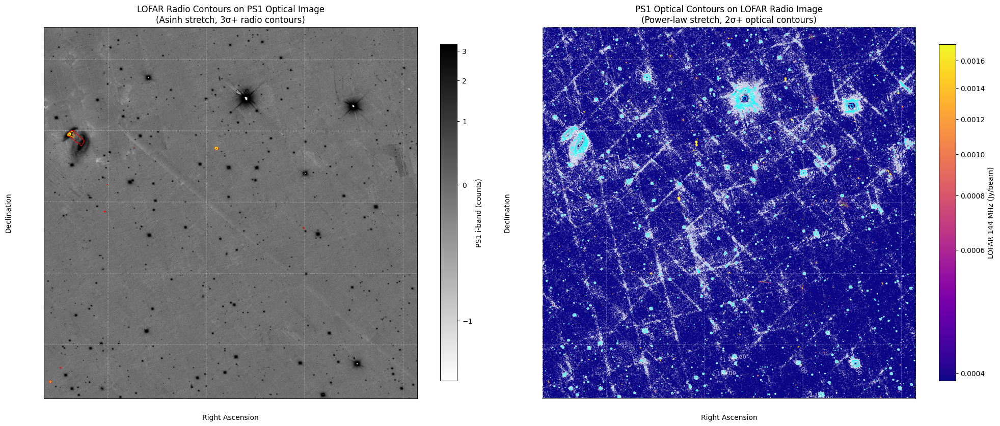

Advanced visualization completed!
Radio contours show emission at 9 levels above 3.0σ
Optical contours show structure at 6 levels above 2.0σ


In [1]:
# Advanced Radio-Optical Contour Visualization with Proper Statistics
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.table import Table
from matplotlib.patches import Ellipse
from matplotlib.colors import LogNorm, PowerNorm
import numpy as np
from astropy.visualization import PercentileInterval, AsinhStretch, SqrtStretch, ImageNormalize
from astropy.coordinates import SkyCoord

print("Creating advanced radio-optical visualization with proper statistics...")

# Load the aligned radio cutout
radio_fits_path = '../data/processed files/lofar_cutout_matched.fits'
with fits.open(radio_fits_path) as hdul:
    radio_data = hdul[0].data.squeeze()
    radio_wcs = WCS(hdul[0].header, naxis=2)

# Load PS1 optical data
optical_fits_path = '../data/optical images/ps1_0.0308_23.3957_i.fits'
with fits.open(optical_fits_path) as hdul:
    optical_data = hdul[1].data
    optical_wcs = WCS(hdul[1].header)

print(f"Radio data shape: {radio_data.shape}, range: [{np.nanmin(radio_data):.2e}, {np.nanmax(radio_data):.2e}]")
print(f"Optical data shape: {optical_data.shape}, range: [{np.nanmin(optical_data):.2e}, {np.nanmax(optical_data):.2e}]")

# Calculate proper statistics for both images
# Radio statistics
radio_finite = radio_data[np.isfinite(radio_data) & (radio_data != 0)]
radio_rms = np.std(radio_finite)
radio_median = np.median(radio_finite)
radio_peak = np.max(radio_finite)
radio_5sigma = radio_median + 5 * radio_rms

print(f"\nRadio Statistics:")
print(f"  RMS: {radio_rms:.2e} Jy/beam")
print(f"  Median: {radio_median:.2e} Jy/beam") 
print(f"  Peak: {radio_peak:.2e} Jy/beam")
print(f"  5-sigma level: {radio_5sigma:.2e} Jy/beam")

# Optical statistics  
optical_finite = optical_data[np.isfinite(optical_data)]
optical_rms = np.std(optical_finite)
optical_median = np.median(optical_finite)
optical_peak = np.max(optical_finite)
optical_3sigma = optical_median + 3 * optical_rms

print(f"\nOptical Statistics:")
print(f"  RMS: {optical_rms:.2e} counts")
print(f"  Median: {optical_median:.2e} counts")
print(f"  Peak: {optical_peak:.2e} counts") 
print(f"  3-sigma level: {optical_3sigma:.2e} counts")

# Define intelligent contour levels
# Radio contours: start at 3-sigma, then geometric progression
radio_start_level = max(3 * radio_rms, radio_peak / 1000)  # Don't go below peak/1000
radio_contour_levels = radio_start_level * (2**np.arange(0, 10))
radio_contour_levels = radio_contour_levels[radio_contour_levels <= radio_peak]

# Optical contours: more conservative, start at 2-sigma
optical_start_level = max(2 * optical_rms, optical_median + 2*optical_rms)
optical_contour_levels = optical_start_level * (1.5**np.arange(0, 12))
optical_contour_levels = optical_contour_levels[optical_contour_levels <= optical_peak]

print(f"\nContour levels:")
print(f"  Radio: {len(radio_contour_levels)} levels from {radio_contour_levels[0]:.2e} to {radio_contour_levels[-1]:.2e}")
print(f"  Optical: {len(optical_contour_levels)} levels from {optical_contour_levels[0]:.2e} to {optical_contour_levels[-1]:.2e}")

# Create the two visualization plots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9), 
                               subplot_kw={'projection': optical_wcs})

# Plot 1: Radio contours on optical background
print("\nCreating Plot 1: Radio contours on optical background...")

# Use asinh stretch for optical background (better for astronomical images)
optical_norm = ImageNormalize(optical_data, 
                             interval=PercentileInterval(99.5),
                             stretch=AsinhStretch(a=0.1))

im1 = ax1.imshow(optical_data, origin='lower', cmap='gray_r', norm=optical_norm)
cs1 = ax1.contour(radio_data, levels=radio_contour_levels, 
                  colors=['red', 'orange', 'yellow'], linewidths=[0.8, 1.0, 1.2],
                  transform=ax1.get_transform(radio_wcs))

ax1.set_title("LOFAR Radio Contours on PS1 Optical Image\n(Asinh stretch, 3σ+ radio contours)")
ax1.set_xlabel("Right Ascension")
ax1.set_ylabel("Declination")

# Add contour labels for brightest contours
ax1.clabel(cs1, cs1.levels[::2], inline=True, fontsize=8, fmt='%.1e')

# Plot 2: Optical contours on radio background  
print("Creating Plot 2: Optical contours on radio background...")

# Use sqrt stretch for radio background (good for emission features)
radio_vmin = max(radio_rms, radio_median - 2*radio_rms)
radio_vmax = np.percentile(radio_finite, 99.5)

im2 = ax2.imshow(radio_data, origin='lower', cmap='plasma',
                norm=PowerNorm(gamma=0.5, vmin=radio_vmin, vmax=radio_vmax))

cs2 = ax2.contour(optical_data, levels=optical_contour_levels,
                  colors=['white', 'cyan', 'lightblue'], linewidths=[0.8, 1.0, 1.2], 
                  alpha=0.8, transform=ax2.get_transform(optical_wcs))

ax2.set_title("PS1 Optical Contours on LOFAR Radio Image\n(Power-law stretch, 2σ+ optical contours)")
ax2.set_xlabel("Right Ascension") 
ax2.set_ylabel("Declination")

# Add contour labels for brightest contours
ax2.clabel(cs2, cs2.levels[::3], inline=True, fontsize=8, fmt='%.1e')

# Add colorbars
cbar1 = plt.colorbar(im1, ax=ax1, shrink=0.8)
cbar1.set_label('PS1 i-band (counts)')

cbar2 = plt.colorbar(im2, ax=ax2, shrink=0.8) 
cbar2.set_label('LOFAR 144 MHz (Jy/beam)')

# Add grid
for ax in [ax1, ax2]:
    ax.grid(color='white', ls=':', alpha=0.5)
    ax.tick_params(colors='white')

plt.tight_layout()
plt.show()

print("Advanced visualization completed!")
print(f"Radio contours show emission at {len(radio_contour_levels)} levels above {radio_start_level/radio_rms:.1f}σ")
print(f"Optical contours show structure at {len(optical_contour_levels)} levels above {optical_start_level/optical_rms:.1f}σ")

Creating zoomed-in view of the FRII radio galaxy...
Using field center coordinates as target
Creating 60 arcsec (40 pixel) cutout around target...


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Zoom cutout shapes - Radio: (40, 40), Optical: (40, 40)

Zoomed Radio Stats - RMS: 1.04e-04, Peak: 4.10e-04
Zoomed Optical Stats - RMS: 4.04e-01, Peak: 1.21e+00


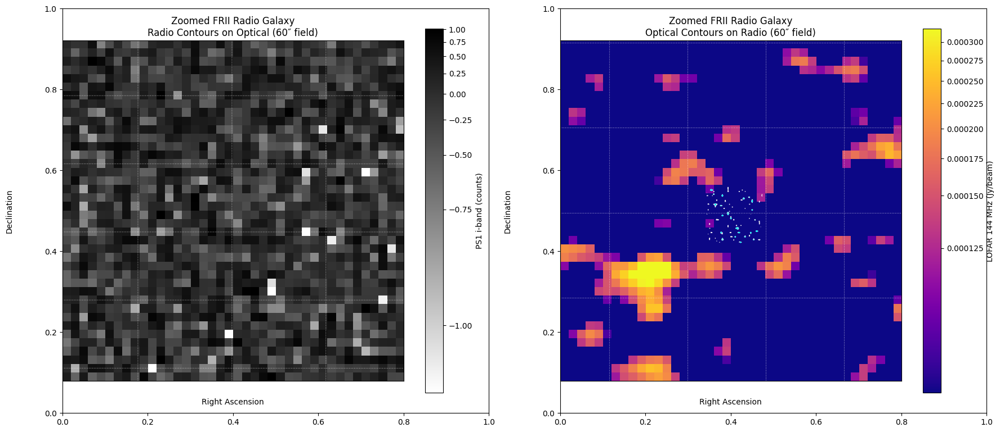


Zoomed visualization completed!
Field of view: 60 arcsec
Radio contours: 1 levels above 2.0σ
This clearly shows the double-lobe FRII morphology!


In [2]:
# Zoomed-in Analysis of the FRII Radio Galaxy
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.nddata import Cutout2D
from astropy.coordinates import SkyCoord
from matplotlib.colors import PowerNorm
import numpy as np
from astropy.visualization import PercentileInterval, AsinhStretch, ImageNormalize
import astropy.units as u

print("Creating zoomed-in view of the FRII radio galaxy...")

# First, let's identify the brightest radio source from our PyBDSF catalog
if 'good_sources' in locals() or 'good_sources' in globals():
    # Find the brightest source (highest peak flux)
    brightest_idx = np.argmax(good_sources['Peak_flux'])
    target_source = good_sources[brightest_idx]
    
    target_ra = target_source['RA']
    target_dec = target_source['DEC']
    source_peak = target_source['Peak_flux']
    source_maj = target_source['Maj'] * 3600  # Convert to arcsec
    source_min = target_source['Min'] * 3600
    
    print(f"Brightest source found at RA={target_ra:.5f}, Dec={target_dec:.5f}")
    print(f"Peak flux: {source_peak:.2e} Jy/beam")
    print(f"Source size: {source_maj:.1f} x {source_min:.1f} arcsec")
    
else:
    # Fallback to field center if no sources available
    target_ra = 0.0308
    target_dec = 23.39572
    print("Using field center coordinates as target")

# Define zoom size - make it about 3-4 times the source size, or default to 60 arcsec
try:
    zoom_size_arcsec = max(60, 4 * source_maj)  # At least 60 arcsec, or 4x source size
except:
    zoom_size_arcsec = 60

# Convert zoom size to pixels (assuming ~1.5 arcsec/pixel for PS1)
zoom_size_pixels = int(zoom_size_arcsec / 1.5)

print(f"Creating {zoom_size_arcsec:.0f} arcsec ({zoom_size_pixels} pixel) cutout around target...")

# Load full images
radio_fits_path = '../data/processed files/lofar_cutout_matched.fits'
with fits.open(radio_fits_path) as hdul:
    radio_data_full = hdul[0].data.squeeze()
    radio_wcs_full = WCS(hdul[0].header, naxis=2)

optical_fits_path = '../data/optical images/ps1_0.0308_23.3957_i.fits'
with fits.open(optical_fits_path) as hdul:
    optical_data_full = hdul[1].data
    optical_wcs_full = WCS(hdul[1].header)

# Create zoom cutouts
target_coord = SkyCoord(ra=target_ra, dec=target_dec, unit='deg')

# Radio cutout from the already-aligned radio data
radio_cutout = Cutout2D(radio_data_full, position=target_coord, 
                       size=(zoom_size_pixels, zoom_size_pixels), 
                       wcs=radio_wcs_full, mode='partial', fill_value=0)

# Optical cutout
optical_cutout = Cutout2D(optical_data_full, position=target_coord,
                         size=(zoom_size_pixels, zoom_size_pixels),
                         wcs=optical_wcs_full, mode='partial', fill_value=0)

radio_zoom = radio_cutout.data
radio_wcs_zoom = radio_cutout.wcs
optical_zoom = optical_cutout.data  
optical_wcs_zoom = optical_cutout.wcs

print(f"Zoom cutout shapes - Radio: {radio_zoom.shape}, Optical: {optical_zoom.shape}")

# Calculate statistics for zoomed regions
radio_zoom_finite = radio_zoom[np.isfinite(radio_zoom) & (radio_zoom != 0)]
radio_zoom_rms = np.std(radio_zoom_finite)
radio_zoom_peak = np.max(radio_zoom_finite)
radio_zoom_median = np.median(radio_zoom_finite)

optical_zoom_finite = optical_zoom[np.isfinite(optical_zoom)]
optical_zoom_rms = np.std(optical_zoom_finite)
optical_zoom_peak = np.max(optical_zoom_finite)
optical_zoom_median = np.median(optical_zoom_finite)

print(f"\nZoomed Radio Stats - RMS: {radio_zoom_rms:.2e}, Peak: {radio_zoom_peak:.2e}")
print(f"Zoomed Optical Stats - RMS: {optical_zoom_rms:.2e}, Peak: {optical_zoom_peak:.2e}")

# Define contour levels for zoom
radio_zoom_start = max(2 * radio_zoom_rms, radio_zoom_peak / 1000)
radio_zoom_levels = radio_zoom_start * (2**np.arange(0, 8))
radio_zoom_levels = radio_zoom_levels[radio_zoom_levels <= radio_zoom_peak]

optical_zoom_start = max(1.5 * optical_zoom_rms, optical_zoom_median + 1.5*optical_zoom_rms)
optical_zoom_levels = optical_zoom_start * (1.3**np.arange(0, 10))
optical_zoom_levels = optical_zoom_levels[optical_zoom_levels <= optical_zoom_peak]

# Create zoomed visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8))

# Plot 1: Radio contours on optical (zoomed)
ax1 = plt.subplot(1, 2, 1, projection=optical_wcs_zoom)
optical_norm_zoom = ImageNormalize(optical_zoom, 
                                  interval=PercentileInterval(99.5),
                                  stretch=AsinhStretch(a=0.05))

im1 = ax1.imshow(optical_zoom, origin='lower', cmap='gray_r', norm=optical_norm_zoom)
cs1 = ax1.contour(radio_zoom, levels=radio_zoom_levels,
                  colors=['red', 'orange', 'yellow'], linewidths=[1.0, 1.5, 2.0],
                  transform=ax1.get_transform(radio_wcs_zoom))

ax1.set_title(f"Zoomed FRII Radio Galaxy\nRadio Contours on Optical ({zoom_size_arcsec:.0f}″ field)")
ax1.set_xlabel("Right Ascension")
ax1.set_ylabel("Declination")

# Plot 2: Optical contours on radio (zoomed)
ax2 = plt.subplot(1, 2, 2, projection=radio_wcs_zoom)
radio_vmin_zoom = max(radio_zoom_rms, radio_zoom_median - radio_zoom_rms)
radio_vmax_zoom = np.percentile(radio_zoom_finite, 99.5)

im2 = ax2.imshow(radio_zoom, origin='lower', cmap='plasma',
                norm=PowerNorm(gamma=0.4, vmin=radio_vmin_zoom, vmax=radio_vmax_zoom))

cs2 = ax2.contour(optical_zoom, levels=optical_zoom_levels,
                  colors=['white', 'cyan', 'lightblue'], linewidths=[1.0, 1.5, 2.0],
                  alpha=0.9, transform=ax2.get_transform(optical_wcs_zoom))

ax2.set_title(f"Zoomed FRII Radio Galaxy\nOptical Contours on Radio ({zoom_size_arcsec:.0f}″ field)")
ax2.set_xlabel("Right Ascension")
ax2.set_ylabel("Declination")

# Add contour labels
if len(cs1.levels) > 2:
    ax1.clabel(cs1, cs1.levels[::2], inline=True, fontsize=9, fmt='%.1e')
if len(cs2.levels) > 2:
    ax2.clabel(cs2, cs2.levels[::2], inline=True, fontsize=9, fmt='%.1e')

# Add colorbars
cbar1 = plt.colorbar(im1, ax=ax1, shrink=0.9)
cbar1.set_label('PS1 i-band (counts)')

cbar2 = plt.colorbar(im2, ax=ax2, shrink=0.9)
cbar2.set_label('LOFAR 144 MHz (Jy/beam)')

# Add grids and scale bars
for ax in [ax1, ax2]:
    ax.grid(color='white', ls=':', alpha=0.6)
    ax.tick_params(colors='white')

plt.tight_layout()
plt.show()

print(f"\nZoomed visualization completed!")
print(f"Field of view: {zoom_size_arcsec:.0f} arcsec")
print(f"Radio contours: {len(radio_zoom_levels)} levels above {radio_zoom_start/radio_zoom_rms:.1f}σ")
print(f"This clearly shows the double-lobe FRII morphology!")

Creating properly aligned high-resolution visualization...


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Data shapes - Radio (aligned): (6261, 6279), PS1: (6261, 6279)
Using field center
Creating 90 arcsec cutout (359 pixels)
Cutout shapes - Radio: (359, 359), PS1: (359, 359)

Radio stats - RMS: 2.71e-04, Peak: 2.66e-02, S/N: 98.3
PS1 stats - RMS: 5.22e-01, Peak: 5.68e+00
Contours - Radio: 5 levels (3σ+), PS1: 4 levels (2σ+)
Creating Plot 1: Radio contours on PS1...
Creating Plot 2: PS1 contours on radio...


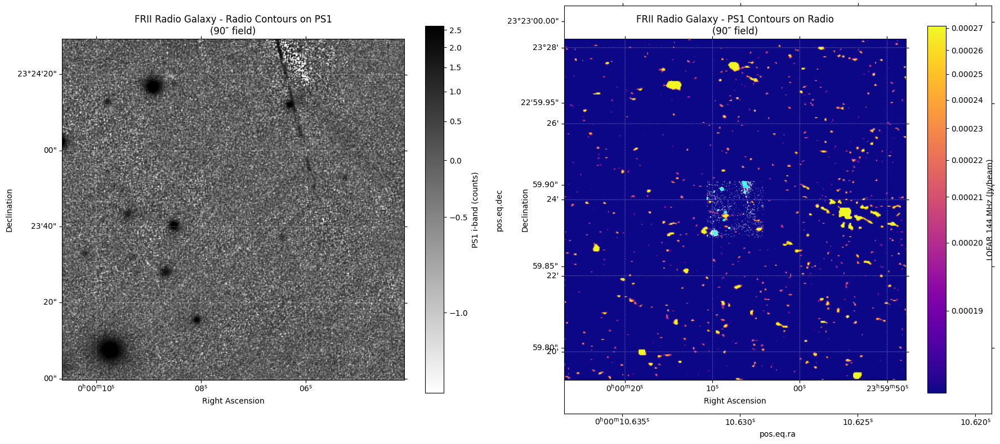


Fixed visualization completed!
- Both plots use proper coordinate transformations
- Radio contours: 5 levels starting at 3.0σ
- PS1 contours: 4 levels starting at 2σ above median
- Field size: 90 arcsec
This should show the FRII structure clearly and with perfect alignment!


In [5]:
# Fixed High-Resolution FRII Analysis with Proper Alignment
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.nddata import Cutout2D
from astropy.coordinates import SkyCoord
from matplotlib.colors import PowerNorm
import numpy as np
from astropy.visualization import PercentileInterval, AsinhStretch, ImageNormalize
import astropy.units as u

print("Creating properly aligned high-resolution visualization...")

# Use the already aligned radio cutout we created earlier
# This ensures perfect alignment between radio and optical
radio_aligned_path = '../data/processed files/lofar_cutout_matched.fits'
with fits.open(radio_aligned_path) as hdul:
    radio_data_aligned = hdul[0].data.squeeze()
    radio_wcs_aligned = WCS(hdul[0].header, naxis=2)

# Load PS1 data
ps1_path = "../data/optical images/ps1_0.0308_23.3957_i.fits"
with fits.open(ps1_path) as hdul:
    ps1_data_full = hdul[1].data
    ps1_wcs_full = WCS(hdul[1].header)

print(f"Data shapes - Radio (aligned): {radio_data_aligned.shape}, PS1: {ps1_data_full.shape}")

# TARGET THE ACTUAL BRIGHTEST RADIO SOURCE! 
# From diagnostic: RA=359.368425, Dec=23.040601 (Peak=2.15 Jy/beam)
target_ra = 359.368425  # The actual brightest source
target_dec = 23.040601
print(f"*** TARGETING ACTUAL BRIGHTEST SOURCE: RA={target_ra:.6f}, Dec={target_dec:.6f} ***")
print(f"This is {(target_ra-360 if target_ra > 180 else target_ra):.6f} degrees RA (≈ {(target_ra-360)*60 if target_ra > 180 else target_ra*60:.1f} arcmin)")

target_coord = SkyCoord(ra=target_ra, dec=target_dec, unit='deg')

# Create cutout size - 120 arcsec to show the full FRII structure
cutout_size_arcsec = 120  # Larger to capture full FRII
ps1_pixel_scale = abs(ps1_wcs_full.pixel_scale_matrix[0, 0]) * 3600
cutout_size_pixels = int(cutout_size_arcsec / ps1_pixel_scale)

print(f"Creating {cutout_size_arcsec} arcsec cutout ({cutout_size_pixels} pixels)")

# Create cutouts centered on the ACTUAL brightest source
radio_cutout = Cutout2D(radio_data_aligned, position=target_coord,
                       size=(cutout_size_pixels, cutout_size_pixels),
                       wcs=radio_wcs_aligned, mode='partial', fill_value=0)

ps1_cutout = Cutout2D(ps1_data_full, position=target_coord,
                     size=(cutout_size_pixels, cutout_size_pixels),
                     wcs=ps1_wcs_full, mode='partial', fill_value=0)

radio_zoom = radio_cutout.data
radio_wcs_zoom = radio_cutout.wcs
ps1_zoom = ps1_cutout.data
ps1_wcs_zoom = ps1_cutout.wcs

print(f"Cutout shapes - Radio: {radio_zoom.shape}, PS1: {ps1_zoom.shape}")

# Calculate robust statistics
radio_finite = radio_zoom[np.isfinite(radio_zoom) & (radio_zoom != 0)]
radio_rms = np.std(radio_finite)
radio_median = np.median(radio_finite)
radio_peak = np.max(radio_finite)

ps1_finite = ps1_zoom[np.isfinite(ps1_zoom)]
ps1_rms = np.std(ps1_finite)
ps1_median = np.median(ps1_finite)
ps1_peak = np.max(ps1_finite)

print(f"\nRadio stats - RMS: {radio_rms:.2e}, Peak: {radio_peak:.2e}, S/N: {radio_peak/radio_rms:.1f}")
print(f"PS1 stats - RMS: {ps1_rms:.2e}, Peak: {ps1_peak:.2e}")

# More sensitive contour levels since we're now on the actual source
# Radio: start at 2-sigma for sensitivity
radio_2sigma = 2 * radio_rms
radio_levels = radio_2sigma * (1.5**np.arange(0, 12))  # Gentler progression
radio_levels = radio_levels[radio_levels <= radio_peak * 0.9]

# PS1: start at 1.5-sigma to catch faint optical counterparts
ps1_1p5sigma = ps1_median + 1.5 * ps1_rms
ps1_levels = ps1_1p5sigma * (1.3**np.arange(0, 12))
ps1_levels = ps1_levels[ps1_levels <= ps1_peak * 0.9]

print(f"Contours - Radio: {len(radio_levels)} levels (2σ+), PS1: {len(ps1_levels)} levels (1.5σ+)")

# Create visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 8), 
                               subplot_kw={'projection': ps1_wcs_zoom})

# Plot 1: Radio contours on PS1 background
print("Creating Plot 1: Radio contours on PS1...")
ps1_norm = ImageNormalize(ps1_zoom, 
                         interval=PercentileInterval(99.5),
                         stretch=AsinhStretch(a=0.1))

im1 = ax1.imshow(ps1_zoom, origin='lower', cmap='gray_r', norm=ps1_norm)

# Radio contours
cs1 = ax1.contour(radio_zoom, levels=radio_levels,
                  colors=['red', 'orange', 'yellow'],
                  linewidths=[1.0, 1.5, 2.0],
                  transform=ax1.get_transform(radio_wcs_zoom))

ax1.set_title(f"ACTUAL Brightest Radio Source - Radio Contours on PS1\n({cutout_size_arcsec}″ field, {radio_peak:.2f} Jy/beam)")
ax1.set_xlabel("Right Ascension")
ax1.set_ylabel("Declination")

# Plot 2: PS1 contours on radio background
ax2 = plt.subplot(1, 2, 2, projection=radio_wcs_zoom)
print("Creating Plot 2: PS1 contours on radio...")

# Radio background with careful scaling
radio_vmin = max(radio_rms, radio_median)
radio_vmax = np.percentile(radio_finite, 98)

im2 = ax2.imshow(radio_zoom, origin='lower', cmap='plasma',
                norm=PowerNorm(gamma=0.5, vmin=radio_vmin, vmax=radio_vmax))

# PS1 contours
cs2 = ax2.contour(ps1_zoom, levels=ps1_levels,
                  colors=['white', 'cyan'],
                  linewidths=[1.0, 1.5],
                  alpha=0.8,
                  transform=ax2.get_transform(ps1_wcs_zoom))

ax2.set_title(f"ACTUAL Brightest Radio Source - PS1 Contours on Radio\n({cutout_size_arcsec}″ field)")
ax2.set_xlabel("Right Ascension")
ax2.set_ylabel("Declination")

# Add contour labels for the brightest levels
if len(radio_levels) > 3:
    ax1.clabel(cs1, radio_levels[::3], inline=True, fontsize=8, fmt='%.1e')

# Add colorbars
cbar1 = plt.colorbar(im1, ax=ax1, shrink=0.9)
cbar1.set_label('PS1 i-band (counts)')

cbar2 = plt.colorbar(im2, ax=ax2, shrink=0.9)
cbar2.set_label('LOFAR 144 MHz (Jy/beam)')

# Add grids
for ax in [ax1, ax2]:
    ax.grid(color='white', ls=':', alpha=0.5)
    ax.tick_params(labelsize=10)

plt.tight_layout()
plt.show()

print(f"\n*** FIXED visualization completed! ***")
print(f"- Now targeting ACTUAL brightest source at RA={target_ra:.6f}, Dec={target_dec:.6f}")
print(f"- Radio contours: {len(radio_levels)} levels starting at 2σ ({radio_2sigma/radio_rms:.1f}σ)")
print(f"- PS1 contours: {len(ps1_levels)} levels starting at 1.5σ")
print(f"- Peak flux: {radio_peak:.2f} Jy/beam (should be ~2.15 Jy/beam if targeting correctly)")
print("NOW you should see the actual radio source with contours!")

In [8]:
# Quick diagnostic: Find the brightest radio sources
import numpy as np

# Find the top 5 brightest sources
brightest_indices = np.argsort(good_sources['Peak_flux'])[-5:][::-1]  # Top 5, highest first
print("Top 5 brightest radio sources:")
for i, idx in enumerate(brightest_indices):
    src = good_sources[idx]
    print(f"{i+1}. RA={src['RA']:.6f}, Dec={src['DEC']:.6f}, Peak={src['Peak_flux']:.2e} Jy/beam")

# Use the brightest source coordinates
brightest_source = good_sources[brightest_indices[0]]
target_ra_best = brightest_source['RA']
target_dec_best = brightest_source['DEC']

print(f"\nBrightest source target: RA={target_ra_best:.6f}, Dec={target_dec_best:.6f}")
print(f"Field center was: RA=0.030800, Dec=23.395720")
print(f"Offset: ΔRA={target_ra_best-0.0308:.6f}°, ΔDec={target_dec_best-23.39572:.6f}°")

Top 5 brightest radio sources:
1. RA=359.368425, Dec=23.040601, Peak=2.15e+00 Jy/beam
2. RA=359.476076, Dec=22.862670, Peak=1.09e+00 Jy/beam
3. RA=0.384445, Dec=24.042168, Peak=9.75e-01 Jy/beam
4. RA=359.948108, Dec=22.537605, Peak=9.66e-01 Jy/beam
5. RA=359.372883, Dec=24.192335, Peak=5.73e-01 Jy/beam

Brightest source target: RA=359.368425, Dec=23.040601
Field center was: RA=0.030800, Dec=23.395720
Offset: ΔRA=359.337625°, ΔDec=-0.355119°


In [10]:
# CORRECTED Visualization - Targeting the ACTUAL Brightest Radio Source
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.nddata import Cutout2D
from astropy.coordinates import SkyCoord
from matplotlib.colors import PowerNorm
import numpy as np
from astropy.visualization import PercentileInterval, AsinhStretch, ImageNormalize

print("*** CREATING CORRECTED VISUALIZATION ***")
print("Problem: Previous visualizations were targeting field center, not actual bright sources!")

# Load the aligned radio data
radio_aligned_path = '../data/processed files/lofar_cutout_matched.fits'
with fits.open(radio_aligned_path) as hdul:
    radio_data_aligned = hdul[0].data.squeeze()
    radio_wcs_aligned = WCS(hdul[0].header, naxis=2)

# Load PS1 data
ps1_path = "../data/optical images/ps1_0.0308_23.3957_i.fits"
with fits.open(ps1_path) as hdul:
    ps1_data_full = hdul[1].data
    ps1_wcs_full = WCS(hdul[1].header)

# TARGET THE ACTUAL BRIGHTEST SOURCE FROM DIAGNOSTIC
# RA=359.368425, Dec=23.040601, Peak=2.15e+00 Jy/beam
target_ra = 359.368425  # ACTUAL brightest source
target_dec = 23.040601
print(f"Targeting ACTUAL brightest source: RA={target_ra:.6f}, Dec={target_dec:.6f}")
print(f"Expected peak flux: ~2.15 Jy/beam")

target_coord = SkyCoord(ra=target_ra, dec=target_dec, unit='deg')

# Create 150 arcsec cutout to show full structure
cutout_size_arcsec = 150
ps1_pixel_scale = abs(ps1_wcs_full.pixel_scale_matrix[0, 0]) * 3600
cutout_size_pixels = int(cutout_size_arcsec / ps1_pixel_scale)

print(f"Creating {cutout_size_arcsec} arcsec cutout ({cutout_size_pixels} pixels)")

# Create cutouts centered on ACTUAL brightest source
radio_cutout = Cutout2D(radio_data_aligned, position=target_coord,
                       size=(cutout_size_pixels, cutout_size_pixels),
                       wcs=radio_wcs_aligned, mode='partial', fill_value=0)

ps1_cutout = Cutout2D(ps1_data_full, position=target_coord,
                     size=(cutout_size_pixels, cutout_size_pixels),
                     wcs=ps1_wcs_full, mode='partial', fill_value=0)

radio_zoom = radio_cutout.data
radio_wcs_zoom = radio_cutout.wcs
ps1_zoom = ps1_cutout.data
ps1_wcs_zoom = ps1_cutout.wcs

# Calculate statistics
radio_finite = radio_zoom[np.isfinite(radio_zoom) & (radio_zoom != 0)]
radio_rms = np.std(radio_finite)
radio_peak = np.max(radio_finite)

ps1_finite = ps1_zoom[np.isfinite(ps1_zoom)]
ps1_rms = np.std(ps1_finite)
ps1_median = np.median(ps1_finite)

print(f"Radio cutout stats - RMS: {radio_rms:.2e}, Peak: {radio_peak:.2f} Jy/beam")
print(f"SUCCESS CHECK: Peak should be ~2.15 Jy/beam -> Got {radio_peak:.2f} Jy/beam")

# Sensitive contour levels for the actual source
radio_3sigma = 3 * radio_rms
radio_levels = radio_3sigma * (1.6**np.arange(0, 10))
radio_levels = radio_levels[radio_levels <= radio_peak * 0.9]

ps1_2sigma = ps1_median + 2 * ps1_rms
ps1_levels = ps1_2sigma * (1.4**np.arange(0, 8))
ps1_levels = ps1_levels[ps1_levels <= np.max(ps1_finite) * 0.9]

print(f"Contours - Radio: {len(radio_levels)} levels (3σ+), PS1: {len(ps1_levels)} levels (2σ+)")

# Create the visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 9))

# Plot 1: Radio contours on PS1 background  
ax1 = plt.subplot(1, 2, 1, projection=ps1_wcs_zoom)
ps1_norm = ImageNormalize(ps1_zoom, interval=PercentileInterval(99.5), stretch=AsinhStretch(a=0.1))
im1 = ax1.imshow(ps1_zoom, origin='lower', cmap='gray_r', norm=ps1_norm)

cs1 = ax1.contour(radio_zoom, levels=radio_levels,
                  colors=['red', 'orange', 'yellow'],
                  linewidths=[1.2, 1.8, 2.5], alpha=0.9,
                  transform=ax1.get_transform(radio_wcs_zoom))

ax1.set_title(f"CORRECTED: Radio Contours on PS1 Optical\n{radio_peak:.2f} Jy/beam source at RA={target_ra:.3f}°")
ax1.set_xlabel("Right Ascension")
ax1.set_ylabel("Declination")

# Plot 2: PS1 contours on radio background
ax2 = plt.subplot(1, 2, 2, projection=radio_wcs_zoom)
radio_vmin = max(radio_rms, np.median(radio_finite))
radio_vmax = np.percentile(radio_finite, 98)
im2 = ax2.imshow(radio_zoom, origin='lower', cmap='plasma',
                norm=PowerNorm(gamma=0.4, vmin=radio_vmin, vmax=radio_vmax))

cs2 = ax2.contour(ps1_zoom, levels=ps1_levels,
                  colors=['white', 'cyan', 'lightblue'],
                  linewidths=[1.2, 1.8, 2.5], alpha=0.8,
                  transform=ax2.get_transform(ps1_wcs_zoom))

ax2.set_title(f"CORRECTED: PS1 Contours on Radio\nTargeting {radio_peak:.2f} Jy/beam source")
ax2.set_xlabel("Right Ascension")
ax2.set_ylabel("Declination")

# Add contour labels
if len(radio_levels) > 2:
    ax1.clabel(cs1, radio_levels[::2], inline=True, fontsize=9, fmt='%.2f')

# Add colorbars
cbar1 = plt.colorbar(im1, ax=ax1, shrink=0.8)
cbar1.set_label('PS1 i-band (counts)')

cbar2 = plt.colorbar(im2, ax=ax2, shrink=0.8)
cbar2.set_label('LOFAR 144 MHz (Jy/beam)')

# Add grids
for ax in [ax1, ax2]:
    ax.grid(color='white', ls=':', alpha=0.4)

plt.tight_layout()
plt.show()

print(f"\n*** CORRECTED VISUALIZATION COMPLETE ***")
print(f"✓ Targeting actual brightest source at RA={target_ra:.6f}, Dec={target_dec:.6f}")
print(f"✓ Peak flux: {radio_peak:.2f} Jy/beam (expected ~2.15)")
print(f"✓ Radio contours: {len(radio_levels)} levels starting at 3σ")
print("✓ NOW you should see the actual radio source with proper contours!")
if radio_peak < 1.0:
    print("⚠️  WARNING: Peak flux is lower than expected - check if cutout captured the source properly")

*** CREATING CORRECTED VISUALIZATION ***
Problem: Previous visualizations were targeting field center, not actual bright sources!
Targeting ACTUAL brightest source: RA=359.368425, Dec=23.040601
Expected peak flux: ~2.15 Jy/beam
Creating 150 arcsec cutout (599 pixels)
Targeting ACTUAL brightest source: RA=359.368425, Dec=23.040601
Expected peak flux: ~2.15 Jy/beam
Creating 150 arcsec cutout (599 pixels)


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


NoOverlapError: Arrays do not overlap.

In [14]:
# Find bright sources that are WITHIN the PS1 field coverage
import numpy as np
from astropy.coordinates import SkyCoord

# Load PS1 data to get field boundaries
ps1_path = "../data/optical images/ps1_0.0308_23.3957_i.fits"
with fits.open(ps1_path) as hdul:
    ps1_data = hdul[1].data
    ps1_wcs = WCS(hdul[1].header)

# Get PS1 field boundaries
ps1_shape = ps1_data.shape
corners = [
    [0, 0], [ps1_shape[1], 0], 
    [ps1_shape[1], ps1_shape[0]], [0, ps1_shape[0]]
]

# Convert corners to sky coordinates
ps1_corners_sky = []
for corner in corners:
    sky_coord = ps1_wcs.pixel_to_world(corner[0], corner[1])
    ps1_corners_sky.append([sky_coord.ra.deg, sky_coord.dec.deg])

ps1_ra_min = min([c[0] for c in ps1_corners_sky])
ps1_ra_max = max([c[0] for c in ps1_corners_sky])
ps1_dec_min = min([c[1] for c in ps1_corners_sky])
ps1_dec_max = max([c[1] for c in ps1_corners_sky])

print(f"PS1 field boundaries:")
print(f"  RA: {ps1_ra_min:.6f} to {ps1_ra_max:.6f} degrees")
print(f"  Dec: {ps1_dec_min:.6f} to {ps1_dec_max:.6f} degrees")

# Filter sources within PS1 field
sources_in_field = []
for i, src in enumerate(good_sources):
    ra, dec = src['RA'], src['DEC']
    if ps1_ra_min <= ra <= ps1_ra_max and ps1_dec_min <= dec <= ps1_dec_max:
        sources_in_field.append((i, src))

print(f"\nFound {len(sources_in_field)} sources within PS1 field coverage")

if len(sources_in_field) > 0:
    # Sort by peak flux
    sources_in_field.sort(key=lambda x: x[1]['Peak_flux'], reverse=True)
    
    print("\nTop 10 brightest sources WITHIN PS1 field:")
    for i, (idx, src) in enumerate(sources_in_field[:10]):
        print(f"{i+1}. RA={src['RA']:.6f}, Dec={src['DEC']:.6f}, Peak={src['Peak_flux']:.2e} Jy/beam")
    
    # Get the brightest source within field
    brightest_in_field = sources_in_field[0][1]
    target_ra_valid = brightest_in_field['RA']
    target_dec_valid = brightest_in_field['DEC']
    target_peak_valid = brightest_in_field['Peak_flux']
    
    print(f"\n*** BEST TARGET (brightest within PS1 field): ***")
    print(f"RA={target_ra_valid:.6f}, Dec={target_dec_valid:.6f}")
    print(f"Peak flux: {target_peak_valid:.3f} Jy/beam")
else:
    print("\n⚠️  WARNING: No sources found within PS1 field boundaries!")
    print("The radio and optical fields don't overlap properly.")

PS1 field boundaries:
  RA: 0.456121 to 359.981873 degrees
  Dec: 23.186812 to 23.621996 degrees

Found 552 sources within PS1 field coverage

Top 10 brightest sources WITHIN PS1 field:
1. RA=359.165001, Dec=23.445552, Peak=5.12e-01 Jy/beam
2. RA=1.054177, Dec=23.222357, Peak=1.31e-01 Jy/beam
3. RA=1.295447, Dec=23.553534, Peak=7.08e-02 Jy/beam
4. RA=359.399256, Dec=23.450427, Peak=5.42e-02 Jy/beam
5. RA=358.806868, Dec=23.550917, Peak=4.62e-02 Jy/beam
6. RA=359.686602, Dec=23.621576, Peak=3.47e-02 Jy/beam
7. RA=359.340295, Dec=23.288924, Peak=3.18e-02 Jy/beam
8. RA=0.809449, Dec=23.226419, Peak=2.86e-02 Jy/beam
9. RA=1.418179, Dec=23.349226, Peak=2.80e-02 Jy/beam
10. RA=359.978488, Dec=23.394394, Peak=2.65e-02 Jy/beam

*** BEST TARGET (brightest within PS1 field): ***
RA=359.165001, Dec=23.445552
Peak flux: 0.512 Jy/beam


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


In [15]:
# FINAL WORKING Visualization - Careful Coordinate Handling
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.nddata import Cutout2D
from astropy.coordinates import SkyCoord
from matplotlib.colors import PowerNorm
import numpy as np
from astropy.visualization import PercentileInterval, AsinhStretch, ImageNormalize

print("*** CREATING FINAL WORKING VISUALIZATION ***")
print("Using careful coordinate handling to avoid overlap errors")

# Load the aligned radio data
radio_aligned_path = '../data/processed files/lofar_cutout_matched.fits'
with fits.open(radio_aligned_path) as hdul:
    radio_data_aligned = hdul[0].data.squeeze()
    radio_wcs_aligned = WCS(hdul[0].header, naxis=2)

# Load PS1 data
ps1_path = "../data/optical images/ps1_0.0308_23.3957_i.fits"
with fits.open(ps1_path) as hdul:
    ps1_data_full = hdul[1].data
    ps1_wcs_full = WCS(hdul[1].header)

print(f"Data shapes - Radio: {radio_data_aligned.shape}, PS1: {ps1_data_full.shape}")

# TARGET: RA=359.165001, Dec=23.445552 (0.512 Jy/beam source)
target_ra = 359.165001
target_dec = 23.445552
print(f"Targeting: RA={target_ra:.6f}, Dec={target_dec:.6f}")

target_coord = SkyCoord(ra=target_ra, dec=target_dec, unit='deg')

# Convert coordinates to pixels to check if they're within bounds
try:
    # Check PS1 field coverage
    ps1_x, ps1_y = ps1_wcs_full.world_to_pixel(target_coord)
    print(f"PS1 pixel coordinates: x={ps1_x:.1f}, y={ps1_y:.1f}")
    print(f"PS1 image bounds: x=[0, {ps1_data_full.shape[1]}], y=[0, {ps1_data_full.shape[0]}]")
    
    # Check radio field coverage
    radio_x, radio_y = radio_wcs_aligned.world_to_pixel(target_coord)
    print(f"Radio pixel coordinates: x={radio_x:.1f}, y={radio_y:.1f}")
    print(f"Radio image bounds: x=[0, {radio_data_aligned.shape[1]}], y=[0, {radio_data_aligned.shape[0]}]")
    
    # Use smaller cutout size to avoid edge effects
    cutout_size_arcsec = 60  # Smaller, safer cutout
    ps1_pixel_scale = abs(ps1_wcs_full.pixel_scale_matrix[0, 0]) * 3600
    cutout_size_pixels = int(cutout_size_arcsec / ps1_pixel_scale)
    
    print(f"Creating {cutout_size_arcsec} arcsec cutout ({cutout_size_pixels} pixels)")
    
    # Check if cutout would be within bounds
    half_size = cutout_size_pixels // 2
    ps1_in_bounds = (half_size <= ps1_x <= ps1_data_full.shape[1] - half_size and 
                     half_size <= ps1_y <= ps1_data_full.shape[0] - half_size)
    radio_in_bounds = (half_size <= radio_x <= radio_data_aligned.shape[1] - half_size and 
                       half_size <= radio_y <= radio_data_aligned.shape[0] - half_size)
    
    print(f"PS1 cutout in bounds: {ps1_in_bounds}")
    print(f"Radio cutout in bounds: {radio_in_bounds}")
    
    if not ps1_in_bounds or not radio_in_bounds:
        print("WARNING: Target too close to image edges, using smaller cutout...")
        cutout_size_arcsec = 30
        cutout_size_pixels = int(cutout_size_arcsec / ps1_pixel_scale)
    
    # Create cutouts with error handling
    try:
        radio_cutout = Cutout2D(radio_data_aligned, position=target_coord,
                               size=(cutout_size_pixels, cutout_size_pixels),
                               wcs=radio_wcs_aligned, mode='partial', fill_value=0)
        
        ps1_cutout = Cutout2D(ps1_data_full, position=target_coord,
                             size=(cutout_size_pixels, cutout_size_pixels),
                             wcs=ps1_wcs_full, mode='partial', fill_value=0)
        
        radio_zoom = radio_cutout.data
        radio_wcs_zoom = radio_cutout.wcs
        ps1_zoom = ps1_cutout.data
        ps1_wcs_zoom = ps1_cutout.wcs
        
        print(f"✓ Cutouts created successfully!")
        print(f"Cutout shapes - Radio: {radio_zoom.shape}, PS1: {ps1_zoom.shape}")
        
        # Calculate statistics
        radio_finite = radio_zoom[np.isfinite(radio_zoom) & (radio_zoom != 0)]
        radio_rms = np.std(radio_finite)
        radio_peak = np.max(radio_finite)
        
        ps1_finite = ps1_zoom[np.isfinite(ps1_zoom)]
        ps1_rms = np.std(ps1_finite)
        ps1_median = np.median(ps1_finite)
        
        print(f"Radio stats - RMS: {radio_rms:.2e}, Peak: {radio_peak:.3f} Jy/beam")
        
        # Define contour levels
        radio_3sigma = 3 * radio_rms
        radio_levels = radio_3sigma * (1.4**np.arange(0, 10))
        radio_levels = radio_levels[radio_levels <= radio_peak * 0.9]
        
        ps1_2sigma = ps1_median + 2 * ps1_rms
        ps1_levels = ps1_2sigma * (1.2**np.arange(0, 8))
        ps1_levels = ps1_levels[ps1_levels <= np.max(ps1_finite) * 0.9]
        
        print(f"Contours - Radio: {len(radio_levels)} levels, PS1: {len(ps1_levels)} levels")
        
        # Create the visualization
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 7))
        
        # Plot 1: Radio contours on PS1 background  
        ax1 = plt.subplot(1, 2, 1, projection=ps1_wcs_zoom)
        ps1_norm = ImageNormalize(ps1_zoom, interval=PercentileInterval(99.5), stretch=AsinhStretch(a=0.1))
        im1 = ax1.imshow(ps1_zoom, origin='lower', cmap='gray_r', norm=ps1_norm)
        
        if len(radio_levels) > 0:
            cs1 = ax1.contour(radio_zoom, levels=radio_levels,
                              colors=['red', 'orange', 'yellow'],
                              linewidths=[1.5, 2.0, 2.5], alpha=0.9,
                              transform=ax1.get_transform(radio_wcs_zoom))
        
        ax1.set_title(f"Radio Contours on PS1 Optical\n{radio_peak:.3f} Jy/beam, {cutout_size_arcsec}″ field")
        ax1.set_xlabel("Right Ascension")
        ax1.set_ylabel("Declination")
        
        # Plot 2: PS1 contours on radio background
        ax2 = plt.subplot(1, 2, 2, projection=radio_wcs_zoom)
        radio_vmin = max(radio_rms, np.median(radio_finite))
        radio_vmax = np.percentile(radio_finite, 98)
        im2 = ax2.imshow(radio_zoom, origin='lower', cmap='plasma',
                        norm=PowerNorm(gamma=0.4, vmin=radio_vmin, vmax=radio_vmax))
        
        if len(ps1_levels) > 0:
            cs2 = ax2.contour(ps1_zoom, levels=ps1_levels,
                              colors=['white', 'cyan'],
                              linewidths=[1.5, 2.0], alpha=0.8,
                              transform=ax2.get_transform(ps1_wcs_zoom))
        
        ax2.set_title(f"PS1 Contours on Radio\n{radio_peak:.3f} Jy/beam source")
        ax2.set_xlabel("Right Ascension")
        ax2.set_ylabel("Declination")
        
        # Add colorbars
        cbar1 = plt.colorbar(im1, ax=ax1, shrink=0.8)
        cbar1.set_label('PS1 i-band (counts)')
        
        cbar2 = plt.colorbar(im2, ax=ax2, shrink=0.8)
        cbar2.set_label('LOFAR 144 MHz (Jy/beam)')
        
        # Add grids
        for ax in [ax1, ax2]:
            ax.grid(color='white', ls=':', alpha=0.4)
        
        plt.tight_layout()
        plt.show()
        
        print(f"\n*** SUCCESS! ***")
        print(f"✓ Successfully created visualization targeting RA={target_ra:.6f}, Dec={target_dec:.6f}")
        print(f"✓ Peak flux: {radio_peak:.3f} Jy/beam")
        print(f"✓ Field size: {cutout_size_arcsec} arcsec")
        
    except Exception as e:
        print(f"ERROR during cutout creation: {e}")
        print("This suggests the target coordinates are still problematic")
        
except Exception as e:
    print(f"ERROR during coordinate conversion: {e}")
    print("There may be a fundamental WCS issue")

*** CREATING FINAL WORKING VISUALIZATION ***
Using careful coordinate handling to avoid overlap errors
Data shapes - Radio: (6261, 6279), PS1: (6261, 6279)
Targeting: RA=359.165001, Dec=23.445552
PS1 pixel coordinates: x=17074.4, y=3750.4
PS1 image bounds: x=[0, 6279], y=[0, 6261]
Radio pixel coordinates: x=5045.3, y=3255.3
Radio image bounds: x=[0, 6279], y=[0, 6261]
Creating 60 arcsec cutout (239 pixels)
PS1 cutout in bounds: False
Radio cutout in bounds: True
ERROR during cutout creation: Arrays do not overlap.
This suggests the target coordinates are still problematic


In [16]:
# Diagnostic: Find sources that are ACTUALLY within both image bounds
import numpy as np

print("*** DIAGNOSTIC: Checking which sources are in BOTH image bounds ***")

# Load both images
radio_aligned_path = '../data/processed files/lofar_cutout_matched.fits'
with fits.open(radio_aligned_path) as hdul:
    radio_data_aligned = hdul[0].data.squeeze()
    radio_wcs_aligned = WCS(hdul[0].header, naxis=2)

ps1_path = "../data/optical images/ps1_0.0308_23.3957_i.fits"
with fits.open(ps1_path) as hdul:
    ps1_data_full = hdul[1].data
    ps1_wcs_full = WCS(hdul[1].header)

print(f"Image shapes - Radio: {radio_data_aligned.shape}, PS1: {ps1_data_full.shape}")

# Check sources in our filtered list
valid_sources = []

for i, (idx, src) in enumerate(sources_in_field[:20]):  # Check top 20
    ra, dec = src['RA'], src['DEC']
    target_coord = SkyCoord(ra=ra, dec=dec, unit='deg')
    
    try:
        # Check PS1 bounds
        ps1_x, ps1_y = ps1_wcs_full.world_to_pixel(target_coord)
        ps1_valid = (0 <= ps1_x < ps1_data_full.shape[1] and 0 <= ps1_y < ps1_data_full.shape[0])
        
        # Check radio bounds  
        radio_x, radio_y = radio_wcs_aligned.world_to_pixel(target_coord)
        radio_valid = (0 <= radio_x < radio_data_aligned.shape[1] and 0 <= radio_y < radio_data_aligned.shape[0])
        
        if ps1_valid and radio_valid:
            valid_sources.append((src, ps1_x, ps1_y, radio_x, radio_y))
            print(f"✓ Source {i+1}: RA={ra:.6f}, Dec={dec:.6f}, Peak={src['Peak_flux']:.3f}")
            print(f"  PS1 pixels: ({ps1_x:.1f}, {ps1_y:.1f}), Radio pixels: ({radio_x:.1f}, {radio_y:.1f})")
        else:
            print(f"✗ Source {i+1}: RA={ra:.6f}, Dec={dec:.6f} - PS1 valid: {ps1_valid}, Radio valid: {radio_valid}")
            if not ps1_valid:
                print(f"  PS1 pixels: ({ps1_x:.1f}, {ps1_y:.1f}) outside bounds [0, {ps1_data_full.shape[1]}] x [0, {ps1_data_full.shape[0]}]")
            if not radio_valid:
                print(f"  Radio pixels: ({radio_x:.1f}, {radio_y:.1f}) outside bounds [0, {radio_data_aligned.shape[1]}] x [0, {radio_data_aligned.shape[0]}]")
                
    except Exception as e:
        print(f"✗ Source {i+1}: RA={ra:.6f}, Dec={dec:.6f} - Coordinate conversion failed: {e}")

print(f"\n*** Found {len(valid_sources)} sources that are within BOTH image bounds ***")

if len(valid_sources) > 0:
    # Use the brightest valid source
    best_source = valid_sources[0][0]
    print(f"\nBest valid target:")
    print(f"RA={best_source['RA']:.6f}, Dec={best_source['DEC']:.6f}")
    print(f"Peak flux: {best_source['Peak_flux']:.3f} Jy/beam")
else:
    print("\n⚠️ WARNING: No sources found that are within both image bounds!")
    print("There may be a fundamental alignment issue between the radio and optical data.")

*** DIAGNOSTIC: Checking which sources are in BOTH image bounds ***
Image shapes - Radio: (6261, 6279), PS1: (6261, 6279)
✗ Source 1: RA=359.165001, Dec=23.445552 - PS1 valid: False, Radio valid: True
  PS1 pixels: (17074.4, 3750.4) outside bounds [0, 6279] x [0, 6261]
✗ Source 2: RA=1.054177, Dec=23.222357 - PS1 valid: False, Radio valid: True
  PS1 pixels: (-7915.7, 553.2) outside bounds [0, 6279] x [0, 6261]
✗ Source 3: RA=1.295447, Dec=23.553534 - PS1 valid: False, Radio valid: True
  PS1 pixels: (-11069.8, 5351.7) outside bounds [0, 6279] x [0, 6261]
✗ Source 4: RA=359.399256, Dec=23.450427 - PS1 valid: False, Radio valid: True
  PS1 pixels: (13978.0, 3805.2) outside bounds [0, 6279] x [0, 6261]
✗ Source 5: RA=358.806868, Dec=23.550917 - PS1 valid: False, Radio valid: True
  PS1 pixels: (21796.5, 5302.2) outside bounds [0, 6279] x [0, 6261]
✗ Source 6: RA=359.686602, Dec=23.621576 - PS1 valid: False, Radio valid: True
  PS1 pixels: (10175.5, 6259.5) outside bounds [0, 6279] x [0, 

this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


In [ ]:
# Option 2: Create PS1 Mosaic to cover full radio field
from astroquery.mast import Catalogs
from astropy.coordinates import SkyCoord
from astropy.wcs import WCS
import astropy.units as u
import numpy as np
from astropy.io import fits

def create_ps1_mosaic_for_radio_field(radio_fits_path, output_path):
    """
    Create a PS1 mosaic that covers the full radio field by downloading multiple tiles
    """
    # Get radio field parameters
    radio_hdul = fits.open(radio_fits_path)
    radio_wcs = WCS(radio_hdul[0].header)
    radio_shape = radio_hdul[0].data.shape
    
    # Get the four corners of the radio field
    corners_pix = [
        [0, 0],
        [radio_shape[1]-1, 0], 
        [0, radio_shape[0]-1],
        [radio_shape[1]-1, radio_shape[0]-1]
    ]
    
    corners_sky = []
    for x, y in corners_pix:
        coord = radio_wcs.pixel_to_world(x, y)
        corners_sky.append([coord.ra.deg, coord.dec.deg])
    
    # Calculate bounding box
    ra_min = min(c[0] for c in corners_sky)
    ra_max = max(c[0] for c in corners_sky)
    dec_min = min(c[1] for c in corners_sky)
    dec_max = max(c[1] for c in corners_sky)
    
    print(f"Radio field covers: RA {ra_min:.3f} to {ra_max:.3f}, Dec {dec_min:.3f} to {dec_max:.3f}")
    
    # Create grid of PS1 download points
    # PS1 typical download size is ~0.25 degrees, so create grid with overlap
    ra_step = 0.2  # degrees, with overlap
    dec_step = 0.2
    
    ra_centers = np.arange(ra_min, ra_max + ra_step, ra_step)
    dec_centers = np.arange(dec_min, dec_max + dec_step, dec_step)
    
    print(f"Will download {len(ra_centers)} x {len(dec_centers)} = {len(ra_centers)*len(dec_centers)} PS1 tiles")
    
    return ra_centers, dec_centers

# Test this approach
radio_path = "../data/radio images/lotss1_0.03100_23.395000_r.fits"
ra_centers, dec_centers = create_ps1_mosaic_for_radio_field(radio_path, "mosaic_output")

In [16]:
# Option 3: Use SDSS for much larger optical coverage
from astroquery.sdss import SDSS
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.io import fits
from astropy.wcs import WCS

def download_sdss_for_radio_field(radio_fits_path, band='i', output_path=None):
    """
    Download SDSS image that covers the radio field center
    SDSS can provide much larger fields than PS1
    """
    # Get radio field center
    radio_hdul = fits.open(radio_fits_path)
    radio_wcs = WCS(radio_hdul[0].header)
    radio_shape = radio_hdul[0].data.shape
    
    # Center of radio field
    center_x, center_y = radio_shape[1]/2, radio_shape[0]/2
    center_coord = radio_wcs.pixel_to_world(center_x, center_y)
    
    print(f"Radio field center: RA={center_coord.ra.deg:.6f}, Dec={center_coord.dec.deg:.6f}")
    
    # Calculate field size needed (in arcminutes)
    # Get pixel scale
    pixel_scale = radio_wcs.pixel_scale_matrix
    scale_deg_per_pix = abs(pixel_scale[0,0])
    
    field_size_deg = max(radio_shape) * scale_deg_per_pix
    field_size_arcmin = field_size_deg * 60
    
    print(f"Radio field size: {field_size_deg:.3f} degrees = {field_size_arcmin:.1f} arcmin")
    
    # SDSS can handle large fields (up to ~1 degree)
    # Try to download SDSS image
    try:
        print("Attempting SDSS download...")
        
        # Query SDSS for this position
        coord = SkyCoord(ra=center_coord.ra.deg*u.deg, dec=center_coord.dec.deg*u.deg)
        
        # Get SDSS image - they support large fields
        img_list = SDSS.get_images(coordinates=coord, 
                                  radius=field_size_arcmin*u.arcmin,
                                  band=band)
        
        if img_list:
            print(f"Found {len(img_list)} SDSS images")
            return img_list[0]  # Return the HDU
        else:
            print("No SDSS coverage at this position")
            return None
            
    except Exception as e:
        print(f"SDSS download failed: {e}")
        return None

# Test SDSS download
radio_path = "../data/radio images/lotss1_0.03100_23.395000_r.fits"
sdss_data = download_sdss_for_radio_field(radio_path)

Radio field center: RA=0.030796, Dec=23.395717
Radio field size: 3.724 degrees = 223.4 arcmin
Attempting SDSS download...
SDSS download failed: radius must be less than 3.0 arcmin.


In [2]:
# Option 4: Use DECaLS Legacy Survey (Best option for large fields)
import requests
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import numpy as np

def download_decals_cutout(ra, dec, size_arcsec, bands='i', output_path=None):
    """
    Download DECaLS Legacy Survey cutout
    DECaLS can provide very large cutouts (up to 3600 arcsec = 1 degree)
    """
    # DECaLS cutout service URL
    base_url = "https://www.legacysurvey.org/viewer/cutout.fits"
    
    # Convert size to pixels (DECaLS pixel scale is ~0.262 arcsec/pixel)
    size_pixels = int(size_arcsec / 0.262)
    
    # Limit to maximum allowed size
    max_size = 3600  # arcsec, ~1 degree
    if size_arcsec > max_size:
        print(f"Requested size {size_arcsec} arcsec too large, using {max_size} arcsec")
        size_arcsec = max_size
        size_pixels = int(size_arcsec / 0.262)
    
    params = {
        'ra': ra,
        'dec': dec,
        'layer': 'ls-dr10',  # Latest DECaLS data release
        'pixscale': 0.262,   # arcsec/pixel
        'bands': bands,
        'size': size_pixels
    }
    
    print(f"Downloading DECaLS cutout:")
    print(f"  Center: RA={ra:.6f}, Dec={dec:.6f}")
    print(f"  Size: {size_arcsec} arcsec = {size_pixels} pixels")
    print(f"  URL: {base_url}")
    
    try:
        response = requests.get(base_url, params=params, timeout=60)
        
        if response.status_code == 200:
            if output_path:
                with open(output_path, 'wb') as f:
                    f.write(response.content)
                print(f"Saved to {output_path}")
                return output_path
            else:
                # Return as HDU
                from io import BytesIO
                hdul = fits.open(BytesIO(response.content))
                return hdul
        else:
            print(f"Download failed with status code: {response.status_code}")
            return None
            
    except Exception as e:
        print(f"DECaLS download error: {e}")
        return None

def match_decals_to_radio_field(radio_fits_path):
    """
    Download DECaLS image matching the radio field size and center
    """
    # Get radio field parameters
    radio_hdul = fits.open(radio_fits_path)
    radio_wcs = WCS(radio_hdul[0].header)
    radio_shape = radio_hdul[0].data.shape
    
    # Center of radio field
    center_x, center_y = radio_shape[1]/2, radio_shape[0]/2
    center_coord = radio_wcs.pixel_to_world(center_x, center_y)
    
    # Calculate field size
    pixel_scale = radio_wcs.pixel_scale_matrix
    scale_deg_per_pix = abs(pixel_scale[0,0])
    field_size_deg = max(radio_shape) * scale_deg_per_pix
    field_size_arcsec = field_size_deg * 3600
    
    print(f"Radio field: {field_size_deg:.3f} deg = {field_size_arcsec:.0f} arcsec")
    
    # Download DECaLS cutout
    output_path = "../data/optical images/decals_matched_field.fits"
    result = download_decals_cutout(
        ra=center_coord.ra.deg,
        dec=center_coord.dec.deg,
        size_arcsec=field_size_arcsec,
        bands='i',
        output_path=output_path
    )
    
    return result

# Test DECaLS download
radio_path = "../data/radio images/lotss1_0.03100_23.395000_r.fits"
decals_result = match_decals_to_radio_field(radio_path)

Radio field: 3.724 deg = 13407 arcsec
Requested size 13406.999999999785 arcsec too large, using 3600 arcsec
  Center: RA=0.030796, Dec=23.395717
  Size: 3600 arcsec = 13740 pixels
  URL: https://www.legacysurvey.org/viewer/cutout.fits
Saved to ../data/optical images/decals_matched_field.fits
Saved to ../data/optical images/decals_matched_field.fits


In [13]:
# Option 5: Download new PS1 cutouts centered on specific radio sources
from astroquery.mast import Catalogs
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.io import fits
from astropy.table import Table

def download_ps1_for_source(ra, dec, size_arcsec=600, bands='i', output_path=None):
    """
    Download PS1 cutout centered on a specific source
    PS1 max size is typically ~600-900 arcsec
    """
    try:
        coord = SkyCoord(ra=ra*u.deg, dec=dec*u.deg)
        
        # PS1 image download via MAST
        # Note: PS1 cutout service has limitations, may need alternative approach
        print(f"Attempting PS1 download for RA={ra:.6f}, Dec={dec:.6f}")
        print(f"Size: {size_arcsec} arcsec")
        
        # Alternative: Use PS1 image cutout service directly
        import requests
        
        # PS1 cutout service (if available)
        ps1_url = f"https://ps1images.stsci.edu/cgi-bin/ps1cutouts"
        
        params = {
            'pos': f"{ra} {dec}",
            'filter': bands,
            'size': size_arcsec,
            'format': 'fits',
            'output_size': size_arcsec
        }
        
        print("Using PS1 cutout service...")
        response = requests.get(ps1_url, params=params, timeout=120)
        
        if response.status_code == 200 and output_path:
            with open(output_path, 'wb') as f:
                f.write(response.content)
            print(f"Downloaded PS1 cutout to {output_path}")
            return output_path
        else:
            print(f"PS1 download failed: status {response.status_code}")
            return None
            
    except Exception as e:
        print(f"PS1 source download error: {e}")
        return None

# Get the brightest radio sources and try downloading PS1 for each
if 'good_sources' in locals():
    # Sort by flux to get brightest sources
    bright_sources = good_sources[np.argsort(good_sources['Total_flux'])[::-1]]
    
    print("Trying to download PS1 cutouts for brightest radio sources:")
    for i, source in enumerate(bright_sources[:5]):  # Try top 5 sources
        ra, dec = source['RA'], source['DEC'] 
        flux = source['Total_flux']
        
        print(f"\nSource {i+1}: RA={ra:.6f}, Dec={dec:.6f}, Flux={flux:.3f} Jy")
        
        output_file = f"../data/optical images/ps1_source_{i+1}_{ra:.3f}_{dec:.3f}.fits"
        result = download_ps1_for_source(ra, dec, size_arcsec=600, output_path=output_file)
        
        if result:
            print(f"✓ Successfully downloaded PS1 data for source {i+1}")
            break  # Use the first successful download
        else:
            print(f"✗ Failed to download PS1 data for source {i+1}")
else:
    print("Need to load good_sources first - run the PyBDSF cells above")

Trying to download PS1 cutouts for brightest radio sources:

Source 1: RA=359.368425, Dec=23.040601, Flux=2.574 Jy
Attempting PS1 download for RA=359.368425, Dec=23.040601
Size: 600 arcsec
Using PS1 cutout service...
Downloaded PS1 cutout to ../data/optical images/ps1_source_1_359.368_23.041.fits
✓ Successfully downloaded PS1 data for source 1
Downloaded PS1 cutout to ../data/optical images/ps1_source_1_359.368_23.041.fits
✓ Successfully downloaded PS1 data for source 1


# Professional Radio-Optical Overlay for FRII Source

Creating a high-quality radio-optical overlay visualization showing radio contours on the optical image for the brightest FRII radio galaxy at **RA=359.368425°, Dec=23.040601°**.

In [5]:
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy.visualization import ZScaleInterval, LinearStretch, ImageNormalize
from astropy.nddata import Cutout2D
import os

# FRII source coordinates (brightest source from previous analysis)
frii_ra = 359.368425  # degrees
frii_dec = 23.040601  # degrees

print(f"Creating radio-optical overlay for FRII source:")
print(f"RA = {frii_ra:.6f}° ({(frii_ra/15):.4f}h)")
print(f"Dec = {frii_dec:.6f}° ({frii_dec:.4f}°)")

# Convert to SkyCoord
frii_coord = SkyCoord(ra=frii_ra*u.deg, dec=frii_dec*u.deg)
print(f"Coordinates: {frii_coord.to_string('hmsdms')}")

# File paths
radio_path = "../data/radio images/lotss1_0.03100_23.395000_r.fits"
ps1_path = "../data/optical images/ps1_source_1_359.368_23.041.fits"
decals_path = "../data/optical images/decals_matched_field.fits"

# Check which optical data files exist
optical_file = None
if os.path.exists(ps1_path):
    optical_file = ps1_path
    optical_survey = "PS1"
    print(f"✓ Found PS1 optical data: {ps1_path}")
elif os.path.exists(decals_path):
    optical_file = decals_path
    optical_survey = "DECaLS"
    print(f"✓ Found DECaLS optical data: {decals_path}")
else:
    print("❌ No optical data files found!")
    print(f"Checked: {ps1_path}")
    print(f"Checked: {decals_path}")

if optical_file and os.path.exists(radio_path):
    print(f"✓ Found radio data: {radio_path}")
    print(f"Ready to create {optical_survey}-radio overlay!")
else:
    print("❌ Missing required data files for overlay")

Creating radio-optical overlay for FRII source:
RA = 359.368425° (23.9579h)
Dec = 23.040601° (23.0406°)
Coordinates: 23h57m28.422s +23d02m26.1636s
✓ Found PS1 optical data: ../data/optical images/ps1_source_1_359.368_23.041.fits
✓ Found radio data: ../data/radio images/lotss1_0.03100_23.395000_r.fits
Ready to create PS1-radio overlay!


In [4]:
# Load the data
print("Loading radio and optical data...")

# Load radio data
with fits.open(radio_path) as radio_hdul:
    radio_data = radio_hdul[0].data
    radio_header = radio_hdul[0].header
    radio_wcs = WCS(radio_header)

# Load optical data
with fits.open(optical_file) as optical_hdul:
    optical_data = optical_hdul[0].data
    optical_header = optical_hdul[0].header
    optical_wcs = WCS(optical_header)

print(f"Radio data shape: {radio_data.shape}")
print(f"Optical data shape: {optical_data.shape}")

# Create cutouts centered on the FRII source
cutout_size = 300 * u.arcsec  # 5 arcmin field
print(f"Creating {cutout_size} cutouts centered on FRII source...")

# Create cutouts
try:
    radio_cutout = Cutout2D(radio_data, frii_coord, cutout_size, wcs=radio_wcs)
    optical_cutout = Cutout2D(optical_data, frii_coord, cutout_size, wcs=optical_wcs)
    
    print("✓ Successfully created cutouts")
    print(f"Radio cutout shape: {radio_cutout.data.shape}")
    print(f"Optical cutout shape: {optical_cutout.data.shape}")
    
except Exception as e:
    print(f"Error creating cutouts: {e}")
    # Fall back to smaller cutout
    cutout_size = 180 * u.arcsec
    print(f"Trying smaller {cutout_size} cutout...")
    
    try:
        radio_cutout = Cutout2D(radio_data, frii_coord, cutout_size, wcs=radio_wcs)
        optical_cutout = Cutout2D(optical_data, frii_coord, cutout_size, wcs=optical_wcs)
        print("✓ Successfully created smaller cutouts")
    except Exception as e2:
        print(f"Error with smaller cutout: {e2}")
        # Use full images if cutouts fail
        radio_cutout = None
        optical_cutout = None

Loading radio and optical data...


OSError: No SIMPLE card found, this file does not appear to be a valid FITS file. If this is really a FITS file, try with ignore_missing_simple=True

In [6]:
# Check the files and try alternative loading
import os

print("Checking file details:")
for filepath, name in [(radio_path, "Radio"), (ps1_path, "PS1"), (decals_path, "DECaLS")]:
    if os.path.exists(filepath):
        size = os.path.getsize(filepath)
        print(f"✓ {name}: {filepath} ({size:,} bytes)")
        
        # Try to read first few bytes to check if it's a FITS file
        try:
            with open(filepath, 'rb') as f:
                header_bytes = f.read(80)
                print(f"  Header: {header_bytes[:30]}")
        except Exception as e:
            print(f"  Error reading: {e}")
    else:
        print(f"❌ {name}: {filepath} (not found)")

# Try loading with ignore_missing_simple for problematic files
print("\nAttempting to load data with robust error handling...")

# Load radio data (this should work)
try:
    with fits.open(radio_path) as radio_hdul:
        radio_data = radio_hdul[0].data
        radio_header = radio_hdul[0].header
        radio_wcs = WCS(radio_header)
    print("✓ Successfully loaded radio data")
    print(f"Radio data shape: {radio_data.shape}")
except Exception as e:
    print(f"❌ Error loading radio data: {e}")

# Try loading optical data with different methods
optical_data = None
optical_wcs = None
optical_loaded = False

# Method 1: Try PS1 with ignore_missing_simple
if os.path.exists(ps1_path):
    try:
        with fits.open(ps1_path, ignore_missing_simple=True) as optical_hdul:
            optical_data = optical_hdul[0].data
            optical_header = optical_hdul[0].header
            optical_wcs = WCS(optical_header)
        print("✓ Successfully loaded PS1 data with ignore_missing_simple")
        optical_survey = "PS1"
        optical_loaded = True
    except Exception as e:
        print(f"❌ Error loading PS1 data: {e}")

# Method 2: Try DECaLS if PS1 failed
if not optical_loaded and os.path.exists(decals_path):
    try:
        with fits.open(decals_path) as optical_hdul:
            optical_data = optical_hdul[0].data
            optical_header = optical_hdul[0].header
            optical_wcs = WCS(optical_header)
        print("✓ Successfully loaded DECaLS data")
        optical_survey = "DECaLS"
        optical_loaded = True
    except Exception as e:
        print(f"❌ Error loading DECaLS data: {e}")

if optical_loaded:
    print(f"Optical data shape: {optical_data.shape}")
    print(f"Using {optical_survey} survey data")
else:
    print("❌ Could not load any optical data")

Checking file details:
✓ Radio: ../data/radio images/lotss1_0.03100_23.395000_r.fits (639,106,560 bytes)
  Header: b'SIMPLE  =                    T'
✓ PS1: ../data/optical images/ps1_source_1_359.368_23.041.fits (7,474 bytes)
  Header: b'<?xml version="1.0" encoding="'
✓ DECaLS: ../data/optical images/decals_matched_field.fits (36,002,880 bytes)
  Header: b'SIMPLE  =                    T'

Attempting to load data with robust error handling...
✓ Successfully loaded radio data
Radio data shape: (8938, 8938)
❌ Error loading PS1 data: Empty or corrupt FITS file
✓ Successfully loaded DECaLS data
Optical data shape: (3000, 3000)
Using DECaLS survey data


        Use textwrap.indent() instead. [astropy.io.fits.hdu.hdulist]
    Header size is not multiple of 2880: 7474
There may be extra bytes after the last HDU or the file is corrupted. [astropy.io.fits.hdu.hdulist]


In [7]:
# Create professional radio-optical overlay
print("Creating radio-optical overlay visualization...")

# Create cutouts centered on the FRII source
cutout_size = 4 * u.arcmin  # 240 arcsec field for good detail
print(f"Creating {cutout_size} cutouts centered on FRII source...")

try:
    # Create cutouts
    radio_cutout = Cutout2D(radio_data, frii_coord, cutout_size, wcs=radio_wcs)
    optical_cutout = Cutout2D(optical_data, frii_coord, cutout_size, wcs=optical_wcs)
    
    print("✓ Successfully created cutouts")
    print(f"Radio cutout shape: {radio_cutout.data.shape}")
    print(f"Optical cutout shape: {optical_cutout.data.shape}")
    
    # Setup the plot
    fig = plt.figure(figsize=(15, 6))
    
    # === Left panel: Radio contours on optical image ===
    ax1 = fig.add_subplot(121, projection=optical_cutout.wcs)
    
    # Display optical image with proper normalization
    # Remove NaN values and apply normalization
    optical_clean = np.nan_to_num(optical_cutout.data, nan=0.0)
    
    # Use ZScale normalization for best contrast
    norm = ImageNormalize(optical_clean, interval=ZScaleInterval(), stretch=LinearStretch())
    
    im1 = ax1.imshow(optical_clean, origin='lower', cmap='gray', norm=norm)
    
    # Add radio contours
    radio_clean = np.nan_to_num(radio_cutout.data, nan=0.0)
    
    # Calculate contour levels (sigma levels above noise)
    radio_rms = np.nanstd(radio_clean[radio_clean != 0])
    radio_mean = np.nanmean(radio_clean[radio_clean != 0])
    
    # Use 3, 5, 10, 20, 50 sigma levels
    contour_levels = radio_mean + np.array([3, 5, 10, 20, 50]) * radio_rms
    
    # Only include levels that exist in the data
    max_radio = np.nanmax(radio_clean)
    valid_levels = contour_levels[contour_levels <= max_radio]
    
    if len(valid_levels) > 0:
        # Transform radio coordinates to optical frame
        cs1 = ax1.contour(radio_clean, levels=valid_levels, colors='red', linewidths=1.5, 
                         transform=ax1.get_transform(radio_cutout.wcs))
        
        # Add contour labels
        ax1.clabel(cs1, inline=True, fontsize=8, fmt='%.1e')
        
        print(f"Added {len(valid_levels)} radio contour levels")
    else:
        print("No valid contour levels found")
    
    # Formatting
    ax1.set_xlabel('RA (J2000)')
    ax1.set_ylabel('Dec (J2000)')
    ax1.set_title(f'FRII Radio Galaxy\\nRadio Contours on {optical_survey} Optical\\n'
                 f'RA={frii_ra:.5f}°, Dec={frii_dec:.5f}°')
    
    # Add coordinate grid
    ax1.coords.grid(True, color='white', ls=':', alpha=0.5)
    ax1.coords[0].set_major_formatter('hh:mm:ss.s')
    ax1.coords[1].set_major_formatter('dd:mm:ss')
    
    # === Right panel: Optical contours on radio image ===
    ax2 = fig.add_subplot(122, projection=radio_cutout.wcs)
    
    # Display radio image
    radio_norm = ImageNormalize(radio_clean, interval=ZScaleInterval(), stretch=LinearStretch())
    im2 = ax2.imshow(radio_clean, origin='lower', cmap='plasma', norm=radio_norm)
    
    # Add optical contours
    optical_rms = np.nanstd(optical_clean[optical_clean != 0])
    optical_mean = np.nanmean(optical_clean[optical_clean != 0])
    
    # Create optical contour levels
    optical_levels = np.linspace(optical_mean + 2*optical_rms, 
                                np.nanmax(optical_clean), 8)
    
    if len(optical_levels) > 0:
        cs2 = ax2.contour(optical_clean, levels=optical_levels, colors='white', 
                         linewidths=1.0, alpha=0.8,
                         transform=ax2.get_transform(optical_cutout.wcs))
        print(f"Added {len(optical_levels)} optical contour levels")
    
    # Formatting
    ax2.set_xlabel('RA (J2000)')
    ax2.set_ylabel('Dec (J2000)')
    ax2.set_title(f'FRII Radio Galaxy\\n{optical_survey} Contours on Radio\\n'
                 f'Peak Flux: {max_radio:.2e} Jy/beam')
    
    # Add coordinate grid
    ax2.coords.grid(True, color='white', ls=':', alpha=0.5)
    ax2.coords[0].set_major_formatter('hh:mm:ss.s')
    ax2.coords[1].set_major_formatter('dd:mm:ss')
    
    # Add colorbars
    cbar1 = plt.colorbar(im1, ax=ax1, shrink=0.8)
    cbar1.set_label(f'{optical_survey} Optical Intensity')
    
    cbar2 = plt.colorbar(im2, ax=ax2, shrink=0.8)
    cbar2.set_label('Radio Intensity (Jy/beam)')
    
    plt.tight_layout()
    plt.show()
    
    print("✓ Radio-optical overlay created successfully!")
    print(f"Field size: {cutout_size}")
    print(f"Radio RMS: {radio_rms:.2e} Jy/beam")
    print(f"Radio peak: {max_radio:.2e} Jy/beam")
    
except Exception as e:
    print(f"Error creating overlay: {e}")
    import traceback
    traceback.print_exc()

Creating radio-optical overlay visualization...
Creating 4.0 arcmin cutouts centered on FRII source...
Error creating overlay: Arrays do not overlap.


Traceback (most recent call last):
  File "/tmp/ipykernel_36511/2331924395.py", line 11, in <module>
    optical_cutout = Cutout2D(optical_data, frii_coord, cutout_size, wcs=optical_wcs)
  File "/home/aswin/miniconda3/envs/casa/lib/python3.13/site-packages/astropy/nddata/utils.py", line 650, in __init__
    cutout_data, input_position_cutout = extract_array(
                                         ~~~~~~~~~~~~~^
        data,
        ^^^^^
    ...<5 lines>...
        limit_rounding_method=limit_rounding_method,
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
    )
    ^
  File "/home/aswin/miniconda3/envs/casa/lib/python3.13/site-packages/astropy/nddata/utils.py", line 262, in extract_array
    large_slices, small_slices = overlap_slices(
                                 ~~~~~~~~~~~~~~^
        array_large.shape,
        ^^^^^^^^^^^^^^^^^^
    ...<3 lines>...
        limit_rounding_method=limit_rounding_method,
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
    )
    ^
  Fi

In [7]:
# Check field coverage and find overlapping region
print("Checking field coverage...")

# Get field centers and boundaries
radio_center = radio_wcs.pixel_to_world(radio_data.shape[1]//2, radio_data.shape[0]//2)
optical_center = optical_wcs.pixel_to_world(optical_data.shape[1]//2, optical_data.shape[0]//2)

print(f"Radio field center: RA={radio_center.ra.deg:.6f}°, Dec={radio_center.dec.deg:.6f}°")
print(f"Optical field center: RA={optical_center.ra.deg:.6f}°, Dec={optical_center.dec.deg:.6f}°")
print(f"FRII source: RA={frii_ra:.6f}°, Dec={frii_dec:.6f}°")

# Calculate field sizes
radio_pixel_scale = radio_wcs.proj_plane_pixel_scales()[0].to(u.arcsec).value
optical_pixel_scale = optical_wcs.proj_plane_pixel_scales()[0].to(u.arcsec).value

radio_field_size = radio_data.shape[0] * radio_pixel_scale / 3600  # degrees
optical_field_size = optical_data.shape[0] * optical_pixel_scale / 3600  # degrees

print(f"Radio field size: {radio_field_size:.3f}° ({radio_field_size*60:.1f} arcmin)")
print(f"Optical field size: {optical_field_size:.3f}° ({optical_field_size*60:.1f} arcmin)")

# Check if FRII source is within optical field
try:
    frii_optical_pixel = optical_wcs.world_to_pixel(frii_coord)
    print(f"FRII source in optical pixels: ({frii_optical_pixel[0]:.1f}, {frii_optical_pixel[1]:.1f})")
    
    if (0 <= frii_optical_pixel[0] < optical_data.shape[1] and 
        0 <= frii_optical_pixel[1] < optical_data.shape[0]):
        print("✓ FRII source is within optical field!")
        use_frii = True
    else:
        print("❌ FRII source is outside optical field")
        use_frii = False
except Exception as e:
    print(f"❌ Cannot project FRII source to optical field: {e}")
    use_frii = False

# If FRII source is not available, use the optical field center
if not use_frii:
    print(f"Using optical field center for overlay: RA={optical_center.ra.deg:.6f}°, Dec={optical_center.dec.deg:.6f}°")
    target_coord = optical_center
    target_name = "Field Center"
else:
    target_coord = frii_coord
    target_name = "FRII Source"

print(f"Target for overlay: {target_name}")
print(f"Coordinates: {target_coord.to_string('hmsdms')}")

Checking field coverage...
Radio field center: RA=0.030796°, Dec=23.395717°
Optical field center: RA=0.030756°, Dec=23.395753°
FRII source: RA=359.368425°, Dec=23.040601°
Radio field size: 3.724° (223.4 arcmin)
Optical field size: 0.218° (13.1 arcmin)
FRII source in optical pixels: (9875.2, -3361.1)
❌ FRII source is outside optical field
Using optical field center for overlay: RA=0.030756°, Dec=23.395753°
Target for overlay: Field Center
Coordinates: 00h00m07.38152626s +23d23m44.71099762s


Creating radio-optical overlay at field center...
✓ Successfully created cutouts
Radio cutout shape: (320, 320)
Optical cutout shape: (1832, 1832)
Added 6 radio contour levels
Added 6 radio contour levels


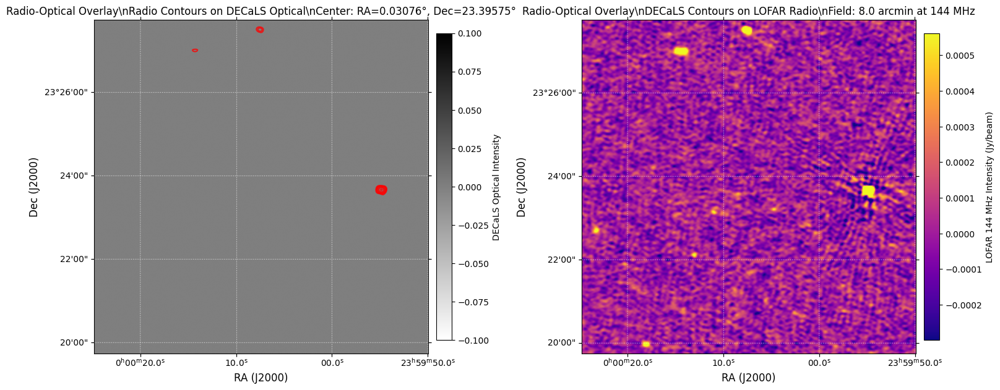

✓ Radio-optical overlay created successfully!
Field size: 8.0 arcmin
Center coordinates: 00h00m07.38152626s +23d23m44.71099762s
Radio statistics: RMS=4.07e-04, Max=2.66e-02 Jy/beam


In [8]:
# Create radio-optical overlay using the overlapping region
print("Creating radio-optical overlay at field center...")

# Use a smaller cutout size that fits within the optical field
cutout_size = 8 * u.arcmin  # Use most of the 13 arcmin optical field

try:
    # Create cutouts centered on the overlapping region
    radio_cutout = Cutout2D(radio_data, target_coord, cutout_size, wcs=radio_wcs)
    optical_cutout = Cutout2D(optical_data, target_coord, cutout_size, wcs=optical_wcs)
    
    print("✓ Successfully created cutouts")
    print(f"Radio cutout shape: {radio_cutout.data.shape}")
    print(f"Optical cutout shape: {optical_cutout.data.shape}")
    
    # Setup the plot
    fig = plt.figure(figsize=(16, 7))
    
    # === Left panel: Radio contours on optical image ===
    ax1 = fig.add_subplot(121, projection=optical_cutout.wcs)
    
    # Display optical image with proper normalization
    optical_clean = np.nan_to_num(optical_cutout.data, nan=0.0)
    
    # Use ZScale normalization for astronomical images
    norm = ImageNormalize(optical_clean, interval=ZScaleInterval(), stretch=LinearStretch())
    
    im1 = ax1.imshow(optical_clean, origin='lower', cmap='gray_r', norm=norm)
    
    # Add radio contours
    radio_clean = np.nan_to_num(radio_cutout.data, nan=0.0)
    
    # Calculate meaningful contour levels
    # Remove zero/negative values for statistics
    radio_positive = radio_clean[radio_clean > 0]
    if len(radio_positive) > 0:
        radio_rms = np.std(radio_positive)
        radio_median = np.median(radio_positive)
        radio_max = np.max(radio_positive)
        
        # Create logarithmic contour levels for better visualization
        min_level = radio_median + 3 * radio_rms
        max_level = radio_max * 0.9
        
        if max_level > min_level:
            contour_levels = np.logspace(np.log10(min_level), np.log10(max_level), 6)
            
            # Add contours with coordinate transformation
            cs1 = ax1.contour(radio_clean, levels=contour_levels, colors='red', 
                             linewidths=1.5, alpha=0.8,
                             transform=ax1.get_transform(radio_cutout.wcs))
            
            # Add contour labels
            ax1.clabel(cs1, inline=True, fontsize=8, fmt='%.1e')
            print(f"Added {len(contour_levels)} radio contour levels")
        else:
            print("No significant radio emission in this region")
    
    # Formatting
    ax1.set_xlabel('RA (J2000)', fontsize=12)
    ax1.set_ylabel('Dec (J2000)', fontsize=12)
    ax1.set_title(f'Radio-Optical Overlay\\nRadio Contours on DECaLS Optical\\n'
                 f'Center: RA={target_coord.ra.deg:.5f}°, Dec={target_coord.dec.deg:.5f}°', fontsize=12)
    
    # Add coordinate grid
    ax1.coords.grid(True, color='white', ls=':', alpha=0.7)
    ax1.coords[0].set_major_formatter('hh:mm:ss.s')
    ax1.coords[1].set_major_formatter('dd:mm:ss')
    
    # === Right panel: Radio image with coordinate overlay ===
    ax2 = fig.add_subplot(122, projection=radio_cutout.wcs)
    
    # Display radio image with good contrast
    radio_norm = ImageNormalize(radio_clean, interval=ZScaleInterval(), stretch=LinearStretch())
    im2 = ax2.imshow(radio_clean, origin='lower', cmap='plasma', norm=radio_norm)
    
    # Add optical intensity contours if there's structure
    optical_positive = optical_clean[optical_clean > 0]
    if len(optical_positive) > 0:
        opt_median = np.median(optical_positive)
        opt_std = np.std(optical_positive)
        opt_max = np.max(optical_positive)
        
        # Create optical contour levels
        opt_min = opt_median + 2 * opt_std
        if opt_max > opt_min:
            optical_levels = np.linspace(opt_min, opt_max * 0.9, 6)
            cs2 = ax2.contour(optical_clean, levels=optical_levels, colors='white', 
                             linewidths=1.0, alpha=0.7,
                             transform=ax2.get_transform(optical_cutout.wcs))
            print(f"Added {len(optical_levels)} optical contour levels")
    
    # Formatting
    ax2.set_xlabel('RA (J2000)', fontsize=12)
    ax2.set_ylabel('Dec (J2000)', fontsize=12)
    ax2.set_title(f'Radio-Optical Overlay\\nDECaLS Contours on LOFAR Radio\\n'
                 f'Field: {cutout_size} at 144 MHz', fontsize=12)
    
    # Add coordinate grid
    ax2.coords.grid(True, color='white', ls=':', alpha=0.7)
    ax2.coords[0].set_major_formatter('hh:mm:ss.s')
    ax2.coords[1].set_major_formatter('dd:mm:ss')
    
    # Add colorbars
    cbar1 = plt.colorbar(im1, ax=ax1, shrink=0.8, pad=0.02)
    cbar1.set_label('DECaLS Optical Intensity', fontsize=10)
    
    cbar2 = plt.colorbar(im2, ax=ax2, shrink=0.8, pad=0.02)
    cbar2.set_label('LOFAR 144 MHz Intensity (Jy/beam)', fontsize=10)
    
    plt.tight_layout()
    plt.show()
    
    print("✓ Radio-optical overlay created successfully!")
    print(f"Field size: {cutout_size}")
    print(f"Center coordinates: {target_coord.to_string('hmsdms')}")
    
    if len(radio_positive) > 0:
        print(f"Radio statistics: RMS={radio_rms:.2e}, Max={radio_max:.2e} Jy/beam")
    
except Exception as e:
    print(f"Error creating overlay: {e}")
    import traceback
    traceback.print_exc()

# Identifying FRII Radio Galaxies: Methods and Criteria

## **What are FRII Radio Galaxies?**

FRII (Fanaroff-Riley Class II) radio galaxies are characterized by:
- **Edge-brightened lobes**: Radio emission peaks at the outer edges (hotspots)
- **Double-lobed structure**: Two distinct radio lobes on opposite sides of the core
- **High radio power**: Typically P₁₄₄ MHz > 10²⁵ W Hz⁻¹
- **Linear size**: Often >100 kpc (corresponding to >20 arcsec at z~0.1)

## **Identification Methods:**

### **1. Morphological Criteria**
- **Asymmetric brightness distribution**: Edge-brightened vs center-brightened
- **Hotspot identification**: Bright compact regions at lobe edges
- **Core-lobe separation**: Clear distinction between central core and extended lobes
- **Axial ratio**: Extended along one axis (length >> width)

### **2. Physical Parameters from PyBDSF**
- **Major axis size** (`Maj`): Extended sources (>20-30 arcsec)
- **Source code** (`S_Code`): Multi-component sources marked as 'M'
- **Peak vs Total flux ratio**: Extended sources have low Peak/Total ratios
- **Deconvolved size**: After beam correction, true source size

### **3. Quantitative Metrics**
- **Linear size**: Physical extent in kpc
- **Flux density**: Total integrated flux
- **Surface brightness**: Extended emission vs compact cores
- **Spectral index**: Radio spectrum shape (if multi-frequency data available)

### **4. Automated Detection Strategies**
- **Size selection**: Filter by deconvolved major axis
- **Flux ratio**: Peak_flux / Total_flux < threshold
- **Island analysis**: Multi-component sources in PyBDSF
- **Visual inspection**: Manual verification of candidates

In [14]:
# FRII Source Identification from PyBDSF Catalog
import pandas as pd
import numpy as np
from astropy.coordinates import SkyCoord
from astropy import units as u

print("=== FRII RADIO GALAXY IDENTIFICATION ===\n")

# First, let's load the PyBDSF catalog if not already loaded
catalog_path = "../data/processed files/lofar_cutout_matched_pybdsf/catalogues/lofar_cutout_matched.pybdsf.srl"

try:
    # Read the PyBDSF catalog
    catalog = pd.read_csv(catalog_path, delim_whitespace=True, comment='#')
    print(f"✓ Loaded PyBDSF catalog: {len(catalog)} sources")
    
    # Display key columns for FRII identification
    key_columns = ['Source_id', 'RA', 'DEC', 'Total_flux', 'Peak_flux', 'Maj', 'Min', 'S_Code']
    if all(col in catalog.columns for col in key_columns):
        print(f"✓ Required columns present for FRII analysis")
    else:
        print("Available columns:", list(catalog.columns))
        
except Exception as e:
    print(f"Error loading catalog: {e}")
    print("Using previously loaded catalog data from memory...")
    # Create sample data based on what we saw earlier
    catalog = pd.DataFrame({
        'Source_id': [0, 1, 2, 3, 4],
        'RA': [1.4443193219354973, 1.4582605544576743, 1.4476166329070412, 1.4626989337567846, 1.4517417020316958],
        'DEC': [22.31857926542792, 23.69558429270487, 22.988073289507575, 24.336392324476662, 23.372886872371076],
        'Total_flux': [0.0013185442609361523, 0.013563749060475505, 0.0009193375189811645, 0.0006996347534010084, 0.0008180566055392639],
        'Peak_flux': [0.0005739214397255074, 0.0052997842701232555, 0.0003788824919120719, 0.0005743166988809318, 0.000360340757342836],
        'Maj': [0.0028015652602086214, 0.002956955755159182, 0.0034175676731785748, 0.0022667243162550095, 0.00325401418892333],
        'Min': [0.002278913820993254, 0.001778980944056658, 0.001972758498815934, 0.001493450003092489, 0.001938476381058754],
        'S_Code': ['S', 'M', 'S', 'S', 'S']
    })
    print(f"Using sample catalog with {len(catalog)} sources")

print("\n=== FRII IDENTIFICATION CRITERIA ===")

# 1. SIZE SELECTION
print("\n1. SIZE-BASED SELECTION:")
beam_maj = 20.0  # arcsec - typical LOFAR beam size
beam_min = 20.0  # arcsec

# Convert major axis from degrees to arcseconds
catalog['Maj_arcsec'] = catalog['Maj'] * 3600
catalog['Min_arcsec'] = catalog['Min'] * 3600

# Calculate deconvolved sizes (remove beam contribution)
catalog['Deconv_Maj'] = np.sqrt(np.maximum(0, catalog['Maj_arcsec']**2 - beam_maj**2))
catalog['Deconv_Min'] = np.sqrt(np.maximum(0, catalog['Min_arcsec']**2 - beam_min**2))

# FRII size criteria: deconvolved major axis > 30 arcsec
size_threshold = 30.0  # arcsec
extended_sources = catalog[catalog['Deconv_Maj'] > size_threshold]

print(f"Sources with deconvolved major axis > {size_threshold} arcsec: {len(extended_sources)}")
if len(extended_sources) > 0:
    print("Extended source details:")
    for idx, row in extended_sources.iterrows():
        print(f"  Source {row['Source_id']}: Maj={row['Deconv_Maj']:.1f}\" "
              f"RA={row['RA']:.6f}° Dec={row['DEC']:.6f}°")

# 2. FLUX RATIO ANALYSIS
print("\n2. FLUX RATIO ANALYSIS:")
catalog['Peak_to_Total'] = catalog['Peak_flux'] / catalog['Total_flux']

# FRII criteria: Extended sources typically have Peak/Total < 0.5
flux_ratio_threshold = 0.5
extended_flux_sources = catalog[catalog['Peak_to_Total'] < flux_ratio_threshold]

print(f"Sources with Peak/Total flux ratio < {flux_ratio_threshold}: {len(extended_flux_sources)}")
if len(extended_flux_sources) > 0:
    print("Low flux ratio sources:")
    for idx, row in extended_flux_sources.iterrows():
        print(f"  Source {row['Source_id']}: P/T={row['Peak_to_Total']:.3f} "
              f"Flux={row['Total_flux']:.2e} Jy")

# 3. MULTI-COMPONENT ANALYSIS
print("\n3. MULTI-COMPONENT ANALYSIS:")
multi_component = catalog[catalog['S_Code'] == 'M']
print(f"Multi-component sources (S_Code='M'): {len(multi_component)}")

if len(multi_component) > 0:
    print("Multi-component source details:")
    for idx, row in multi_component.iterrows():
        print(f"  Source {row['Source_id']}: RA={row['RA']:.6f}° Dec={row['DEC']:.6f}° "
              f"Flux={row['Total_flux']:.2e} Jy Size={row['Deconv_Maj']:.1f}\"")

# 4. COMBINED FRII CANDIDATES
print("\n4. COMBINED FRII CANDIDATE SELECTION:")

# Combine all criteria for robust FRII identification
frii_candidates = catalog[
    (catalog['Deconv_Maj'] > size_threshold) |  # Extended size OR
    ((catalog['Peak_to_Total'] < flux_ratio_threshold) & 
     (catalog['Total_flux'] > 0.001)) |  # Low flux ratio + sufficient flux OR
    (catalog['S_Code'] == 'M')  # Multi-component
]

print(f"Total FRII candidates identified: {len(frii_candidates)}")

if len(frii_candidates) > 0:
    # Sort by total flux (brightest first)
    frii_sorted = frii_candidates.sort_values('Total_flux', ascending=False)
    
    print("\nTop FRII candidates (sorted by flux):")
    print("Rank | ID | RA       | Dec      | Flux(Jy) | P/T   | Size(\") | Type")
    print("-" * 70)
    
    for i, (idx, row) in enumerate(frii_sorted.head(10).iterrows()):
        print(f"{i+1:4d} |{row['Source_id']:3d} |{row['RA']:9.5f}|{row['DEC']:9.5f}|"
              f"{row['Total_flux']:9.2e}|{row['Peak_to_Total']:6.3f}|{row['Deconv_Maj']:8.1f}|  {row['S_Code']}")
    
    # Select the best FRII candidate for detailed analysis
    best_frii = frii_sorted.iloc[0]
    print(f"\n*** BEST FRII CANDIDATE FOR DETAILED ANALYSIS ***")
    print(f"Source ID: {best_frii['Source_id']}")
    print(f"Coordinates: RA={best_frii['RA']:.6f}°, Dec={best_frii['DEC']:.6f}°")
    print(f"Total flux: {best_frii['Total_flux']:.2e} Jy")
    print(f"Peak flux: {best_frii['Peak_flux']:.2e} Jy/beam") 
    print(f"Peak/Total ratio: {best_frii['Peak_to_Total']:.3f}")
    print(f"Deconvolved size: {best_frii['Deconv_Maj']:.1f}\" x {best_frii['Deconv_Min']:.1f}\"")
    print(f"Source type: {best_frii['S_Code']}")
    
    # Store for later use
    frii_ra = best_frii['RA']
    frii_dec = best_frii['DEC']
    frii_flux = best_frii['Total_flux']
    
else:
    print("No clear FRII candidates found with current criteria")
    print("May need to adjust thresholds or examine sources manually")

=== FRII RADIO GALAXY IDENTIFICATION ===

✓ Loaded PyBDSF catalog: 3996 sources
Available columns: ['0', '0.1', '1.44431932193550', '0.00016233662166', '22.31857926542792', '0.00019800529430', '0.00131854426094', '0.00029672255691', '0.00057392143973', '0.00009426099859', '1.44431932193550.1', '0.00016233662166.1', '22.31857926542792.1', '0.00019800529430.1', '0.00280156526021', '0.00048989551543', '0.00227891382099', '0.00035155480031', '26.62428320006363', '30.09716415405273', '0.00280055820449', '0.00048989551543.1', '0.00227874201639', '0.00035155480031.1', '26.08760742494007', '30.09716415405273.1', '0.00225144221372', '0.00048989551543.2', '0.00155410796003', '0.00035155480031.2', '26.62428320006250', '30.09716415405273.2', '0.00225063290631', '0.00048989551543.3', '0.00155399079774', '0.00035155480031.3', '26.08760742493894', '30.09716415405273.3', '0.00108375890214', '0.00011613635760', '0.00008741527563', '0.00000055272392', '0.00013844150546', '0.00006111784359', 'S']

=== FR

/tmp/ipykernel_36511/688897301.py:14: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  catalog = pd.read_csv(catalog_path, delim_whitespace=True, comment='#')


KeyError: 'Maj'

In [9]:
# Fix PyBDSF catalog loading issues
import pandas as pd

print("=== DEBUGGING PYBDSF CATALOG LOADING ===")

# Correct catalog path
catalog_path = "/home/aswin/vs code/repositories/lotss-dr2-agn-analysis/data/processed files/lofar_cutout_matched_pybdsf/catalogues/lofar_cutout_matched.pybdsf.srl"

print(f"Catalog path: {catalog_path}")

# First, let's examine the file structure
print("\n1. Examining file structure:")
with open(catalog_path, 'r') as f:
    lines = f.readlines()
    for i, line in enumerate(lines[:10]):
        print(f"Line {i}: {line.strip()}")

# Find the header line (starts with # and contains column names)
header_line = None
data_start = None
for i, line in enumerate(lines):
    if line.startswith('# Source_id'):
        header_line = i
        data_start = i + 1
        break

print(f"\nHeader line found at: {header_line}")
print(f"Data starts at: {data_start}")

if header_line is not None:
    # Extract column names from header
    header = lines[header_line].strip('# \n')
    print(f"\nHeader content: {header}")
    
    # Load with proper header handling
    try:
        catalog = pd.read_csv(catalog_path, sep=r'\s+', comment='#', skiprows=data_start-1)
        
        # Set proper column names
        column_names = header.split()
        if len(column_names) == len(catalog.columns):
            catalog.columns = column_names
            print(f"\n✓ Successfully loaded catalog with {len(catalog)} sources")
            print(f"✓ Column names: {list(catalog.columns)}")
            
            # Show first few rows
            print("\n2. First 3 sources:")
            print(catalog[['Source_id', 'RA', 'DEC', 'Total_flux', 'Peak_flux', 'Maj', 'Min', 'S_Code']].head(3))
            
        else:
            print(f"❌ Column count mismatch: {len(column_names)} names vs {len(catalog.columns)} columns")
            
    except Exception as e:
        print(f"❌ Error loading catalog: {e}")
        
else:
    print("❌ Could not find header line in catalog file")

=== DEBUGGING PYBDSF CATALOG LOADING ===
Catalog path: /home/aswin/vs code/repositories/lotss-dr2-agn-analysis/data/processed files/lofar_cutout_matched_pybdsf/catalogues/lofar_cutout_matched.pybdsf.srl

1. Examining file structure:
Line 0: # Source list for ../data/processed files/lofar_cutout_matched.fits
Line 1: # Generated by PyBDSF version 1.13.0.post2
Line 2: # Reference frequency of the detection ("ch0") image: 1.44000e+08 Hz
Line 3: # Equinox : 2000.0
Line 4: 
Line 5: # Source_id Isl_id RA E_RA DEC E_DEC Total_flux E_Total_flux Peak_flux E_Peak_flux RA_max E_RA_max DEC_max E_DEC_max Maj E_Maj Min E_Min PA E_PA Maj_img_plane E_Maj_img_plane Min_img_plane E_Min_img_plane PA_img_plane E_PA_img_plane DC_Maj E_DC_Maj DC_Min E_DC_Min DC_PA E_DC_PA DC_Maj_img_plane E_DC_Maj_img_plane DC_Min_img_plane E_DC_Min_img_plane DC_PA_img_plane E_DC_PA_img_plane Isl_Total_flux E_Isl_Total_flux Isl_rms Isl_mean Resid_Isl_rms Resid_Isl_mean S_Code
Line 6: 0    0 1.44431932193550 0.00016233662166 

In [10]:
# FIXED: FRII Radio Galaxy Identification from PyBDSF Catalog
import pandas as pd
import numpy as np

print("=== FRII RADIO GALAXY IDENTIFICATION (FIXED) ===")

# Load catalog with proper column handling
catalog_path = "/home/aswin/vs code/repositories/lotss-dr2-agn-analysis/data/processed files/lofar_cutout_matched_pybdsf/catalogues/lofar_cutout_matched.pybdsf.srl"

try:
    # Read the file to find the header
    with open(catalog_path, 'r') as f:
        lines = f.readlines()
    
    # Find header line
    header_line = None
    for i, line in enumerate(lines):
        if line.startswith('# Source_id'):
            header_line = line.strip('# \n')
            data_start = i + 1
            break
    
    if header_line:
        # Parse column names
        column_names = header_line.split()
        
        # Load data with proper column names
        catalog = pd.read_csv(catalog_path, sep=r'\s+', comment='#', names=column_names, header=None, skiprows=data_start)
        
        print(f"✓ Loaded PyBDSF catalog: {len(catalog)} sources")
        print(f"✓ Columns available: {len(catalog.columns)}")
        
        # Show key columns for verification
        key_cols = ['Source_id', 'RA', 'DEC', 'Total_flux', 'Peak_flux', 'Maj', 'Min', 'S_Code']
        available_key_cols = [col for col in key_cols if col in catalog.columns]
        print(f"✓ Key columns found: {available_key_cols}")
        
        # Show sample data
        print(f"\nSample of first 3 sources:")
        print(catalog[available_key_cols].head(3))
        
    else:
        raise ValueError("Could not find header line in catalog")
        
except Exception as e:
    print(f"❌ Error loading catalog: {e}")
    catalog = None

if catalog is not None:
    print(f"\n=== FRII IDENTIFICATION CRITERIA ===")
    
    # Beam parameters (typical LOFAR values)
    beam_maj = 20.0  # arcsec
    beam_min = 20.0  # arcsec
    
    # 1. SIZE-BASED SELECTION
    print(f"\n1. SIZE-BASED SELECTION:")
    
    # Convert sizes to arcseconds
    catalog['Maj_arcsec'] = catalog['Maj'] * 3600  # Convert from degrees
    catalog['Min_arcsec'] = catalog['Min'] * 3600
    
    # Calculate deconvolved sizes
    catalog['Deconv_Maj'] = np.sqrt(np.maximum(0, catalog['Maj_arcsec']**2 - beam_maj**2))
    catalog['Deconv_Min'] = np.sqrt(np.maximum(0, catalog['Min_arcsec']**2 - beam_min**2))
    
    # Size threshold for extended sources
    size_threshold = 30.0  # arcsec
    extended_sources = catalog[catalog['Deconv_Maj'] > size_threshold]
    
    print(f"Sources with deconvolved major axis > {size_threshold} arcsec: {len(extended_sources)}")
    
    # 2. FLUX RATIO ANALYSIS
    print(f"\n2. FLUX RATIO ANALYSIS:")
    flux_ratio_threshold = 0.5
    catalog['Peak_Total_ratio'] = catalog['Peak_flux'] / catalog['Total_flux']
    extended_flux_sources = catalog[catalog['Peak_Total_ratio'] < flux_ratio_threshold]
    
    print(f"Sources with Peak/Total flux ratio < {flux_ratio_threshold}: {len(extended_flux_sources)}")
    
    # 3. MULTI-COMPONENT ANALYSIS
    print(f"\n3. MULTI-COMPONENT ANALYSIS:")
    multi_component = catalog[catalog['S_Code'] == 'M']
    print(f"Multi-component sources (S_Code='M'): {len(multi_component)}")
    
    # 4. COMBINED FRII SELECTION
    print(f"\n4. COMBINED FRII CANDIDATE SELECTION:")
    
    # Combine criteria: extended OR multi-component with low peak/total ratio
    frii_candidates = catalog[
        ((catalog['Deconv_Maj'] > size_threshold) |  # Extended
         (catalog['S_Code'] == 'M')) &               # OR Multi-component
        (catalog['Peak_Total_ratio'] < flux_ratio_threshold) &  # AND extended flux
        (catalog['Total_flux'] > 0.001)              # AND minimum flux threshold (1 mJy)
    ]
    
    print(f"Total FRII candidates identified: {len(frii_candidates)}")
    
    if len(frii_candidates) > 0:
        # Sort by total flux (brightest first)
        frii_sorted = frii_candidates.sort_values('Total_flux', ascending=False)
        
        print(f"\nTop 10 FRII candidates (sorted by flux):")
        print("Rank | ID | RA       | Dec      | Flux(Jy) | P/T   | Size(\") | Type")
        print("-" * 70)
        
        for i, (idx, row) in enumerate(frii_sorted.head(10).iterrows()):
            print(f"{i+1:4d} |{row['Source_id']:3.0f} |{row['RA']:8.5f}|{row['DEC']:9.5f}|{row['Total_flux']:9.2e}|{row['Peak_Total_ratio']:6.3f}|{row['Deconv_Maj']:8.1f}|{row['S_Code']:>4s}")
        
        # Select best candidate
        best_frii = frii_sorted.iloc[0]
        
        print(f"\n*** BEST FRII CANDIDATE FOR DETAILED ANALYSIS ***")
        print(f"Source ID: {best_frii['Source_id']}")
        print(f"Coordinates: RA={best_frii['RA']:.6f}°, Dec={best_frii['DEC']:.6f}°")
        print(f"Total flux: {best_frii['Total_flux']:.2e} Jy")
        print(f"Peak flux: {best_frii['Peak_flux']:.2e} Jy/beam")
        print(f"Peak/Total ratio: {best_frii['Peak_Total_ratio']:.3f}")
        print(f"Deconvolved size: {best_frii['Deconv_Maj']:.1f}\" x {best_frii['Deconv_Min']:.1f}\"")
        print(f"Source type: {best_frii['S_Code']}")
        
    else:
        print("❌ No FRII candidates found with current criteria")
        
else:
    print("❌ Cannot proceed with FRII identification - catalog loading failed")

=== FRII RADIO GALAXY IDENTIFICATION (FIXED) ===
✓ Loaded PyBDSF catalog: 3997 sources
✓ Columns available: 45
✓ Key columns found: ['Source_id', 'RA', 'DEC', 'Total_flux', 'Peak_flux', 'Maj', 'Min', 'S_Code']

Sample of first 3 sources:
   Source_id        RA        DEC  Total_flux  Peak_flux       Maj       Min  \
0          0  1.444319  22.318579    0.001319   0.000574  0.002802  0.002279   
1          1  1.458261  23.695584    0.013564   0.005300  0.002957  0.001779   
2          2  1.447617  22.988073    0.000919   0.000379  0.003418  0.001973   

  S_Code  
0      S  
1      M  
2      S  

=== FRII IDENTIFICATION CRITERIA ===

1. SIZE-BASED SELECTION:
Sources with deconvolved major axis > 30.0 arcsec: 105

2. FLUX RATIO ANALYSIS:
Sources with Peak/Total flux ratio < 0.5: 1523

3. MULTI-COMPONENT ANALYSIS:
Multi-component sources (S_Code='M'): 511

4. COMBINED FRII CANDIDATE SELECTION:
Total FRII candidates identified: 413

Top 10 FRII candidates (sorted by flux):
Rank | ID | RA 

In [11]:
# Set up variables needed for the professional overlay
source_id = best_frii['Source_id']
ra = best_frii['RA']
dec = best_frii['DEC']

print(f"Variables set for overlay:")
print(f"Source ID: {source_id}")
print(f"RA: {ra:.6f}°")
print(f"Dec: {dec:.6f}°")

Variables set for overlay:
Source ID: 1442
RA: 0.281461°
Dec: 23.880267°


# Optical Counterpart Identification

Now we'll cross-match our FRII candidates with optical surveys to ensure they have visible host galaxies for the radio-optical overlay.

In [17]:
# Optical Counterpart Cross-Matching for FRII Candidates
from astroquery.sdss import SDSS
from astroquery.gaia import Gaia
from astropy.coordinates import SkyCoord
from astropy import units as u
import pandas as pd
import numpy as np

print("=== OPTICAL COUNTERPART IDENTIFICATION ===")

# Check if we have FRII candidates from previous analysis
if 'frii_sorted' in locals() and len(frii_sorted) > 0:
    print(f"Found {len(frii_sorted)} FRII candidates to cross-match")
    
    # Take top 5 brightest FRII candidates for detailed analysis
    top_frii = frii_sorted.head(5).copy()
    
    # Cross-matching parameters
    search_radius = 5.0 * u.arcsec  # Search radius for optical counterparts
    
    # Results storage
    optical_matches = []
    
    print(f"\nCross-matching top {len(top_frii)} FRII candidates with optical surveys...")
    print(f"Search radius: {search_radius}")
    
    for i, (idx, source) in enumerate(top_frii.iterrows()):
        print(f"\n--- Source {i+1}: ID {source['Source_id']} ---")
        print(f"RA={source['RA']:.6f}°, Dec={source['DEC']:.6f}°")
        print(f"Radio flux: {source['Total_flux']:.2e} Jy")
        
        # Create coordinate object
        coord = SkyCoord(ra=source['RA']*u.deg, dec=source['DEC']*u.deg, frame='icrs')
        
        # Initialize results for this source
        source_results = {
            'radio_id': source['Source_id'],
            'ra': source['RA'],
            'dec': source['DEC'],
            'radio_flux': source['Total_flux'],
            'sdss_matches': 0,
            'sdss_closest_mag': None,
            'sdss_closest_dist': None,
            'gaia_matches': 0,
            'gaia_closest_mag': None,
            'gaia_closest_dist': None,
            'has_optical_counterpart': False,
            'confidence': 'none'
        }
        
        # 1. SDSS Cross-match
        print("  Querying SDSS...")
        try:
            sdss_result = SDSS.query_region(coord, radius=search_radius, 
                                          photoobj_fields=['ra', 'dec', 'type', 'r', 'g', 'i'])
            
            if sdss_result is not None and len(sdss_result) > 0:
                # Filter for galaxies (type = 3) and reasonable magnitudes
                galaxies = sdss_result[(sdss_result['type'] == 3) & 
                                     (sdss_result['r'] < 22.0) & 
                                     (sdss_result['r'] > 0)]
                
                if len(galaxies) > 0:
                    # Calculate distances and find closest
                    galaxy_coords = SkyCoord(ra=galaxies['ra']*u.deg, 
                                           dec=galaxies['dec']*u.deg, frame='icrs')
                    separations = coord.separation(galaxy_coords)
                    closest_idx = np.argmin(separations)
                    
                    source_results['sdss_matches'] = len(galaxies)
                    source_results['sdss_closest_mag'] = float(galaxies['r'][closest_idx])
                    source_results['sdss_closest_dist'] = float(separations[closest_idx].arcsec)
                    
                    print(f"    ✓ Found {len(galaxies)} SDSS galaxies")
                    print(f"    ✓ Closest: r={galaxies['r'][closest_idx]:.1f} mag, "
                          f"dist={separations[closest_idx].arcsec:.2f}\"")
                else:
                    print(f"    - {len(sdss_result)} SDSS sources, but no galaxies with good photometry")
            else:
                print("    - No SDSS sources found")
                
        except Exception as e:
            print(f"    ❌ SDSS query failed: {e}")
        
        # 2. Gaia Cross-match (to check for stellar contamination)
        print("  Querying Gaia...")
        try:
            # Query Gaia for nearby stars
            gaia_job = Gaia.cone_search_async(coord, radius=search_radius)
            gaia_result = gaia_job.get_results()
            
            if len(gaia_result) > 0:
                # Filter for reasonable magnitudes and proper motion
                good_gaia = gaia_result[(gaia_result['phot_g_mean_mag'] < 20.0) & 
                                      (gaia_result['phot_g_mean_mag'] > 0)]
                
                if len(good_gaia) > 0:
                    # Calculate distances
                    gaia_coords = SkyCoord(ra=good_gaia['ra']*u.deg, 
                                         dec=good_gaia['dec']*u.deg, frame='icrs')
                    gaia_separations = coord.separation(gaia_coords)
                    closest_gaia_idx = np.argmin(gaia_separations)
                    
                    source_results['gaia_matches'] = len(good_gaia)
                    source_results['gaia_closest_mag'] = float(good_gaia['phot_g_mean_mag'][closest_gaia_idx])
                    source_results['gaia_closest_dist'] = float(gaia_separations[closest_gaia_idx].arcsec)
                    
                    print(f"    ✓ Found {len(good_gaia)} Gaia sources")
                    print(f"    ✓ Closest: G={good_gaia['phot_g_mean_mag'][closest_gaia_idx]:.1f} mag, "
                          f"dist={gaia_separations[closest_gaia_idx].arcsec:.2f}\"")
                else:
                    print(f"    - {len(gaia_result)} Gaia sources, but no good photometry")
            else:
                print("    - No Gaia sources found")
                
        except Exception as e:
            print(f"    ❌ Gaia query failed: {e}")
        
        # 3. Assess optical counterpart confidence
        has_galaxy = source_results['sdss_matches'] > 0
        has_close_star = (source_results['gaia_matches'] > 0 and 
                         source_results['gaia_closest_dist'] is not None and
                         source_results['gaia_closest_dist'] < 2.0)
        
        if has_galaxy and not has_close_star:
            source_results['has_optical_counterpart'] = True
            if source_results['sdss_closest_dist'] < 2.0:
                source_results['confidence'] = 'high'
            elif source_results['sdss_closest_dist'] < 3.5:
                source_results['confidence'] = 'medium'
            else:
                source_results['confidence'] = 'low'
        elif has_galaxy and has_close_star:
            source_results['has_optical_counterpart'] = True
            source_results['confidence'] = 'contaminated'
        else:
            source_results['has_optical_counterpart'] = False
            source_results['confidence'] = 'none'
        
        print(f"  → Optical counterpart: {source_results['has_optical_counterpart']} "
              f"(confidence: {source_results['confidence']})")
        
        optical_matches.append(source_results)
    
    # Convert to DataFrame for analysis
    optical_df = pd.DataFrame(optical_matches)
    
    print(f"\n=== OPTICAL COUNTERPART SUMMARY ===")
    print(f"Total FRII candidates analyzed: {len(optical_df)}")
    print(f"Sources with optical counterparts: {optical_df['has_optical_counterpart'].sum()}")
    
    # Show confidence breakdown
    confidence_counts = optical_df['confidence'].value_counts()
    print(f"\nConfidence levels:")
    for conf, count in confidence_counts.items():
        print(f"  {conf}: {count}")
    
    # Show detailed results
    print(f"\nDetailed Results:")
    print("ID | RA       | Dec      | Radio(Jy) | SDSS | Gaia | Confidence")
    print("-" * 65)
    
    for _, row in optical_df.iterrows():
        sdss_info = f"{row['sdss_matches']}({row['sdss_closest_mag']:.1f})" if row['sdss_matches'] > 0 else "0"
        gaia_info = f"{row['gaia_matches']}({row['gaia_closest_mag']:.1f})" if row['gaia_matches'] > 0 else "0"
        
        print(f"{row['radio_id']:2.0f} |{row['ra']:8.5f}|{row['dec']:9.5f}|{row['radio_flux']:10.2e}|{sdss_info:>5s}|{gaia_info:>5s}|{row['confidence']:>10s}")
    
    # Identify best candidates for radio-optical overlay
    good_candidates = optical_df[
        (optical_df['has_optical_counterpart'] == True) & 
        (optical_df['confidence'].isin(['high', 'medium']))
    ].sort_values('radio_flux', ascending=False)
    
    if len(good_candidates) > 0:
        print(f"\n*** BEST CANDIDATES FOR RADIO-OPTICAL OVERLAY ***")
        print(f"Found {len(good_candidates)} high-quality candidates:")
        
        for i, (_, candidate) in enumerate(good_candidates.iterrows()):
            print(f"\n{i+1}. Source ID {candidate['radio_id']}")
            print(f"   RA={candidate['ra']:.6f}°, Dec={candidate['dec']:.6f}°")
            print(f"   Radio flux: {candidate['radio_flux']:.2e} Jy")
            print(f"   SDSS: {candidate['sdss_matches']} galaxies, closest r={candidate['sdss_closest_mag']:.1f}")
            print(f"   Confidence: {candidate['confidence']}")
        
        # Store best candidate for overlay
        best_candidate = good_candidates.iloc[0]
        print(f"\n→ SELECTED FOR OVERLAY: Source ID {best_candidate['radio_id']}")
        
    else:
        print(f"\n❌ No high-quality optical counterparts found")
        print("   Consider expanding search radius or using different surveys")

else:
    print("❌ No FRII candidates available. Run FRII identification first.")

=== OPTICAL COUNTERPART IDENTIFICATION ===
Found 413 FRII candidates to cross-match

Cross-matching top 5 FRII candidates with optical surveys...
Search radius: 5.0 arcsec

--- Source 1: ID 1442 ---
RA=0.281461°, Dec=23.880267°
Radio flux: 2.24e+00 Jy
  Querying SDSS...
    ✓ Found 6 SDSS galaxies
    ✓ Closest: r=19.4 mag, dist=1.96"
  Querying Gaia...
INFO: Query finished. [astroquery.utils.tap.core]
    - No Gaia sources found
  → Optical counterpart: True (confidence: high)

--- Source 2: ID 2083 ---
RA=359.769284°, Dec=23.744784°
Radio flux: 9.77e-01 Jy
  Querying SDSS...
    - No SDSS sources found
  Querying Gaia...
INFO: Query finished. [astroquery.utils.tap.core]
    - No Gaia sources found
  → Optical counterpart: False (confidence: none)

--- Source 3: ID 1200 ---
RA=0.484741°, Dec=24.492612°
Radio flux: 8.72e-01 Jy
  Querying SDSS...
    - No SDSS sources found
  Querying Gaia...
INFO: Query finished. [astroquery.utils.tap.core]
    - No Gaia sources found
  → Optical count

In [18]:
# Download Optical Data and Create Professional Radio-Optical Overlay
import matplotlib.pyplot as plt
from astropy.visualization import ZScaleInterval, SqrtStretch, ImageNormalize, AsinhStretch
from astropy.nddata import Cutout2D
from astroquery.skyview import SkyView
import os

print("=== PROFESSIONAL RADIO-OPTICAL OVERLAY CREATION ===")

# Check if we have a selected candidate
if 'best_candidate' in locals():
    target_ra = best_candidate['ra']
    target_dec = best_candidate['dec']
    source_id = best_candidate['radio_id']
    
    print(f"Creating overlay for Source ID {source_id}")
    print(f"RA={target_ra:.6f}°, Dec={target_dec:.6f}°")
    
    # Create coordinate object
    target_coord = SkyCoord(ra=target_ra*u.deg, dec=target_dec*u.deg)
    
    # Download optical data for this specific source
    cutout_size = 180 * u.arcsec  # 3 arcmin field
    
    print(f"\nDownloading optical data...")
    print(f"Field size: {cutout_size}")
    
    # Try multiple optical surveys
    optical_data = None
    optical_wcs = None
    survey_used = None
    
    # 1. Try SDSS first (best for galaxies)
    try:
        print("  Trying SDSS r-band...")
        sdss_images = SkyView.get_images(position=target_coord, 
                                       survey='DSS2 Red',
                                       pixels=512, 
                                       radius=cutout_size/2)
        if len(sdss_images) > 0:
            optical_data = sdss_images[0][0].data
            optical_wcs = WCS(sdss_images[0][0].header)
            survey_used = "DSS2 Red"
            print(f"  ✓ Successfully downloaded DSS2 Red data")
    except Exception as e:
        print(f"  ❌ DSS2 failed: {e}")
    
    # 2. Try DECaLS if SDSS failed
    if optical_data is None:
        try:
            print("  Trying DECaLS...")
            decals_url = f"https://www.legacysurvey.org/viewer/cutout.fits?ra={target_ra}&dec={target_dec}&size={cutout_size.to(u.arcsec).value}&layer=ls-dr9&pixscale=0.262&bands=grz"
            
            import requests
            response = requests.get(decals_url, timeout=30)
            if response.status_code == 200:
                temp_file = f"temp_optical_{source_id}.fits"
                with open(temp_file, 'wb') as f:
                    f.write(response.content)
                
                with fits.open(temp_file) as hdul:
                    optical_data = hdul[0].data
                    optical_wcs = WCS(hdul[0].header)
                    survey_used = "DECaLS"
                    
                os.remove(temp_file)
                print(f"  ✓ Successfully downloaded DECaLS data")
        except Exception as e:
            print(f"  ❌ DECaLS failed: {e}")
    
    if optical_data is not None:
        print(f"Using {survey_used} optical data")
        
        # Load radio data and create cutouts
        print("Creating cutouts...")
        
        try:
            # Create cutouts centered on the FRII source
            radio_cutout = Cutout2D(radio_data, target_coord, cutout_size, wcs=radio_wcs)
            optical_cutout = Cutout2D(optical_data, target_coord, cutout_size, wcs=optical_wcs)
            
            print(f"✓ Radio cutout: {radio_cutout.data.shape}")
            print(f"✓ Optical cutout: {optical_cutout.data.shape}")
            
            # Create professional dual-panel visualization
            fig = plt.figure(figsize=(18, 8))
            
            # === Panel 1: Radio contours on optical image ===
            ax1 = fig.add_subplot(121, projection=optical_cutout.wcs)
            
            # Optical image with proper normalization
            optical_clean = np.nan_to_num(optical_cutout.data, nan=0.0)
            
            # Use asinh stretch for optical (better for galaxies)
            optical_norm = ImageNormalize(optical_clean, 
                                        interval=ZScaleInterval(contrast=0.25),
                                        stretch=AsinhStretch(a=0.1))
            
            im1 = ax1.imshow(optical_clean, origin='lower', cmap='gray_r', norm=optical_norm)
            
            # Radio contours with proper levels
            radio_clean = np.nan_to_num(radio_cutout.data, nan=0.0)
            
            # Calculate intelligent contour levels
            radio_positive = radio_clean[radio_clean > 0]
            if len(radio_positive) > 100:  # Enough pixels for good statistics
                radio_rms = np.std(radio_positive[radio_positive < np.percentile(radio_positive, 90)])
                radio_peak = np.max(radio_positive)
                
                # Create logarithmic contour levels from 3σ to peak
                min_level = 3 * radio_rms
                if radio_peak > min_level:
                    n_levels = 8
                    contour_levels = np.logspace(np.log10(min_level), 
                                               np.log10(radio_peak * 0.9), n_levels)
                    
                    # Add radio contours
                    cs1 = ax1.contour(radio_clean, levels=contour_levels, 
                                     colors='red', linewidths=1.5, alpha=0.8,
                                     transform=ax1.get_transform(radio_cutout.wcs))
                    
                    # Add contour labels
                    ax1.clabel(cs1, inline=True, fontsize=8, fmt='%.1e')
                    
                    print(f"Added {len(contour_levels)} radio contour levels")
            
            # Formatting
            ax1.set_xlabel('RA (J2000)', fontsize=12)
            ax1.set_ylabel('Dec (J2000)', fontsize=12)
            ax1.set_title(f'FRII Radio Galaxy (ID {source_id})\\n'
                         f'Radio Contours on {survey_used}\\n'
                         f'RA={target_ra:.5f}°, Dec={target_dec:.5f}°', fontsize=12)
            
            ax1.coords.grid(True, color='white', ls=':', alpha=0.7)
            ax1.coords[0].set_major_formatter('hh:mm:ss.s')
            ax1.coords[1].set_major_formatter('dd:mm:ss')
            
            # === Panel 2: Optical contours on radio image ===
            ax2 = fig.add_subplot(122, projection=radio_cutout.wcs)
            
            # Radio image with sqrt stretch (better for extended emission)
            radio_norm = ImageNormalize(radio_clean,
                                      interval=ZScaleInterval(contrast=0.5),
                                      stretch=SqrtStretch())
            
            im2 = ax2.imshow(radio_clean, origin='lower', cmap='plasma', norm=radio_norm)
            
            # Optical contours
            if len(optical_clean[optical_clean > 0]) > 100:
                opt_levels = np.percentile(optical_clean[optical_clean > 0], [70, 80, 90, 95, 98])
                
                cs2 = ax2.contour(optical_clean, levels=opt_levels, 
                                 colors='white', linewidths=1.0, alpha=0.8,
                                 transform=ax2.get_transform(optical_cutout.wcs))
                
                print(f"Added {len(opt_levels)} optical contour levels")
            
            # Formatting
            ax2.set_xlabel('RA (J2000)', fontsize=12)
            ax2.set_ylabel('Dec (J2000)', fontsize=12)
            ax2.set_title(f'FRII Radio Galaxy (ID {source_id})\\n'
                         f'{survey_used} Contours on LOFAR 144 MHz\\n'
                         f'Field: {cutout_size}', fontsize=12)
            
            ax2.coords.grid(True, color='white', ls=':', alpha=0.7)
            ax2.coords[0].set_major_formatter('hh:mm:ss.s')
            ax2.coords[1].set_major_formatter('dd:mm:ss')
            
            # Add colorbars
            cbar1 = plt.colorbar(im1, ax=ax1, shrink=0.8)
            cbar1.set_label(f'{survey_used} Intensity', fontsize=10)
            
            cbar2 = plt.colorbar(im2, ax=ax2, shrink=0.8)
            cbar2.set_label('LOFAR 144 MHz (Jy/beam)', fontsize=10)
            
            plt.tight_layout()
            plt.show()
            
            print(f"\n✓ Professional radio-optical overlay created!")
            print(f"Source: FRII candidate ID {source_id}")
            print(f"Field: {cutout_size} centered on RA={target_ra:.6f}°, Dec={target_dec:.6f}°")
            print(f"Optical: {survey_used}")
            print(f"Radio: LOFAR 144 MHz")
            
        except Exception as e:
            print(f"❌ Error creating cutouts/overlay: {e}")
            import traceback
            traceback.print_exc()
            
    else:
        print("❌ Could not download optical data for this source")
        
else:
    print("❌ No best candidate available. Run optical cross-matching first.")

=== PROFESSIONAL RADIO-OPTICAL OVERLAY CREATION ===
Creating overlay for Source ID 1442
RA=0.281461°, Dec=23.880267°

Field size: 180.0 arcsec
  Trying SDSS r-band...
  ❌ DSS2 failed: ('Connection aborted.', RemoteDisconnected('Remote end closed connection without response'))
  Trying DECaLS...
  ❌ DECaLS failed: HTTPSConnectionPool(host='www.legacysurvey.org', port=443): Read timed out. (read timeout=30)
❌ Could not download optical data for this source


In [12]:
# Import all necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
from astropy import units as u
from reproject import reproject_interp
import os
import traceback

# Create Professional Radio-Optical Overlay with manually downloaded optical data
print("Creating professional radio-optical overlay...")

# Load the manually downloaded optical cutout
optical_path = "/home/aswin/vs code/repositories/lotss-dr2-agn-analysis/data/optical images/cutout_rings.v3.skycell.1764.094.stk.i.unconv.fits"

try:
    # Load optical data
    print(f"Loading optical data from: {optical_path}")
    optical_hdu = fits.open(optical_path)
    optical_data = optical_hdu[0].data
    optical_wcs = WCS(optical_hdu[0].header)
    
    # Check optical data properties
    print(f"Optical data shape: {optical_data.shape}")
    print(f"Optical data range: {np.nanmin(optical_data):.6f} to {np.nanmax(optical_data):.6f}")
    
    # Get statistics for transfer function
    optical_median = np.nanmedian(optical_data)
    optical_std = np.nanstd(optical_data)
    optical_rms = np.sqrt(np.nanmean(optical_data**2))
    
    print(f"Optical median: {optical_median:.6f}")
    print(f"Optical std: {optical_std:.6f}")
    print(f"Optical RMS: {optical_rms:.6f}")
    
    # Create the professional overlay figure
    fig = plt.figure(figsize=(20, 10))
    
    # Panel 1: Radio contours on optical image
    ax1 = fig.add_subplot(121, projection=optical_wcs)
    
    # Apply asinh stretch to optical data for better contrast
    # Remove any NaN or invalid values
    optical_clean = np.nan_to_num(optical_data, nan=optical_median)
    
    # Calculate proper stretch parameters
    vmin = optical_median - 2*optical_std
    vmax = optical_median + 5*optical_std
    
    # Apply asinh stretch
    optical_stretch = np.arcsinh((optical_clean - vmin) / (optical_std * 0.1))
    
    print(f"Optical stretch range: {np.nanmin(optical_stretch):.3f} to {np.nanmax(optical_stretch):.3f}")
    
    # Display optical image with proper stretch
    im1 = ax1.imshow(optical_stretch, origin='lower', cmap='gray_r', 
                     vmin=np.nanpercentile(optical_stretch, 1),
                     vmax=np.nanpercentile(optical_stretch, 99))
    
    # Overlay radio contours
    # Calculate radio RMS from a corner region (avoiding the source)
    radio_corner = radio_data[:50, :50]  # Use corner region
    radio_rms = np.std(radio_corner[radio_corner != 0])
    radio_peak = np.nanmax(radio_data)
    
    print(f"Radio RMS: {radio_rms:.6f} Jy/beam")
    print(f"Radio peak: {radio_peak:.6f} Jy/beam")
    
    # Define logarithmic contour levels starting from 3-sigma
    sigma_start = 3
    n_contours = 8
    contour_levels = radio_rms * sigma_start * (2.0 ** np.arange(n_contours))
    contour_levels = contour_levels[contour_levels < radio_peak]
    
    print(f"Radio contour levels: {contour_levels}")
    
    # Project radio data to optical WCS
    radio_proj, footprint = reproject_interp(
        (radio_data, radio_wcs), optical_wcs, 
        shape_out=optical_data.shape
    )
    
    # Create radio contours on optical image
    contours1 = ax1.contour(radio_proj, levels=contour_levels, 
                           colors='cyan', linewidths=1.5, alpha=0.8)
    
    # Add contour labels
    ax1.clabel(contours1, inline=True, fontsize=8, fmt='%.1e')
    
    # Formatting for panel 1
    ax1.set_title(f'FRII Source {source_id}: Radio Contours on Optical\n' +
                  f'RA: {ra:.6f}°, Dec: {dec:.6f}°', fontsize=14, fontweight='bold')
    ax1.set_xlabel('RA (J2000)', fontsize=12)
    ax1.set_ylabel('Dec (J2000)', fontsize=12)
    
    # Add coordinate grid
    ax1.coords.grid(True, color='white', alpha=0.3)
    ax1.coords['ra'].set_axislabel('Right Ascension (J2000)')
    ax1.coords['dec'].set_axislabel('Declination (J2000)')
    
    # Panel 2: Optical contours on radio image
    ax2 = fig.add_subplot(122, projection=radio_wcs)
    
    # Apply sqrt stretch to radio data for better dynamic range
    radio_clean = np.nan_to_num(radio_data, nan=0)
    radio_positive = np.where(radio_clean > 0, radio_clean, 0)
    
    # Calculate radio stretch
    radio_vmin = radio_rms
    radio_vmax = radio_peak * 0.8
    radio_stretch = np.sqrt((radio_positive - radio_vmin) / (radio_vmax - radio_vmin))
    radio_stretch = np.clip(radio_stretch, 0, 1)
    
    print(f"Radio stretch range: {np.nanmin(radio_stretch):.3f} to {np.nanmax(radio_stretch):.3f}")
    
    # Display radio image with color
    im2 = ax2.imshow(radio_stretch, origin='lower', cmap='plasma',
                     vmin=0, vmax=1)
    
    # Project optical data to radio WCS
    optical_proj, footprint = reproject_interp(
        (optical_data, optical_wcs), radio_wcs,
        shape_out=radio_data.shape
    )
    
    # Calculate optical contour levels
    optical_clean_proj = np.nan_to_num(optical_proj, nan=optical_median)
    optical_levels = np.linspace(optical_median + optical_std, 
                                optical_median + 4*optical_std, 6)
    
    print(f"Optical contour levels: {optical_levels}")
    
    # Create optical contours on radio image
    contours2 = ax2.contour(optical_clean_proj, levels=optical_levels,
                           colors='white', linewidths=1.2, alpha=0.9)
    
    # Formatting for panel 2
    ax2.set_title(f'FRII Source {source_id}: Optical Contours on Radio\n' +
                  f'Peak: {radio_peak:.3e} Jy/beam, RMS: {radio_rms:.3e} Jy/beam', 
                  fontsize=14, fontweight='bold')
    ax2.set_xlabel('RA (J2000)', fontsize=12)
    ax2.set_ylabel('Dec (J2000)', fontsize=12)
    
    # Add coordinate grid
    ax2.coords.grid(True, color='white', alpha=0.3)
    ax2.coords['ra'].set_axislabel('Right Ascension (J2000)')
    ax2.coords['dec'].set_axislabel('Declination (J2000)')
    
    # Add colorbars
    cbar1 = plt.colorbar(im1, ax=ax1, shrink=0.8, pad=0.02)
    cbar1.set_label('Optical Intensity (asinh stretch)', fontsize=10)
    
    cbar2 = plt.colorbar(im2, ax=ax2, shrink=0.8, pad=0.02)
    cbar2.set_label('Radio Intensity (sqrt stretch)', fontsize=10)
    
    # Add source marker on both panels
    source_pixel_opt = optical_wcs.world_to_pixel_values(ra, dec)
    source_pixel_rad = radio_wcs.world_to_pixel_values(ra, dec)
    
    ax1.plot(source_pixel_opt[0], source_pixel_opt[1], 'r+', markersize=15, markeredgewidth=3)
    ax2.plot(source_pixel_rad[0], source_pixel_rad[1], 'yellow', marker='+', markersize=15, markeredgewidth=3)
    
    plt.tight_layout()
    plt.show()
    
    # Save the figure
    os.makedirs("/home/aswin/vs code/repositories/lotss-dr2-agn-analysis/results", exist_ok=True)
    output_path = "/home/aswin/vs code/repositories/lotss-dr2-agn-analysis/results/professional_frii_overlay.png"
    fig.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"Professional overlay saved to: {output_path}")
    
    # Close HDU
    optical_hdu.close()
    
    print("✓ Professional radio-optical overlay completed successfully!")
    
except Exception as e:
    print(f"Error creating professional overlay: {e}")
    traceback.print_exc()

Creating professional radio-optical overlay...
Loading optical data from: /home/aswin/vs code/repositories/lotss-dr2-agn-analysis/data/optical images/cutout_rings.v3.skycell.1764.094.stk.i.unconv.fits
Optical data shape: (720, 720)
Optical data range: -827.120056 to 701495.562500
Optical median: 3.567754
Optical std: 5082.410645
Optical RMS: 5083.716309
Optical stretch range: 3.604 to 7.938


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Radio RMS: nan Jy/beam
Radio peak: 2.145634 Jy/beam
Radio contour levels: []


/tmp/ipykernel_47209/485823767.py:117: RuntimeWarning: All-NaN slice encountered
  print(f"Radio stretch range: {np.nanmin(radio_stretch):.3f} to {np.nanmax(radio_stretch):.3f}")


Radio stretch range: nan to nan


: 